In [2]:
import pandas as pd
import time
import numpy as np
import matplotlib.pyplot as plt
from cr_data_inspection_functions import *
from lwa_antpos import reading
import scipy.stats as st
import math
import yaml
import os
import numpy.lib.recfunctions as rfn

Read antpos from etcd


In [3]:
def plothistograms(summary,nbins): 
    plt.figure(figsize=(20,20))

    plt.subplot(4,4,1)
    plt.hist(summary['n_good_antennas'],nbins)
    plt.xlabel('n_good_antennas')
    plt.subplot(4,4,2)
    plt.hist(summary['n_saturated'],nbins)
    plt.xlabel('n_saturated')
    plt.subplot(4,4,3)
    plt.hist(summary['n_kurtosis_bad'],nbins)
    plt.xlabel('n_kurtosis_bad')
    plt.subplot(4,4,4)
    plt.hist(summary['n_power_bad'],nbins)
    plt.xlabel('n_power_bad')

    plt.subplot(4,4,5)
    plt.hist(summary['power_ratioA'],nbins)
    plt.xlabel('power_ratioA')
    plt.subplot(4,4,6)
    plt.hist(summary['power_ratioB'],nbins)
    plt.xlabel('power_ratioB')
    plt.subplot(4,4,7)
    plt.hist(summary['max_core_vs_far_ratio'],nbins)
    plt.xlabel('max_core_vs_far_ratio')
    plt.subplot(4,4,8)
    plt.hist(summary['sum_top_5_core_vs_far_ratio'],nbins)
    plt.xlabel('sum_top_5_core_vs_far_ratio')

    plt.subplot(4,4,9) #these have potential for nans, hence the filtering
    plt.hist(summary['meansnr_nearby'][summary['meansnr_nearby']>0],nbins)
    plt.xlabel('meansnr_nearby')
    plt.subplot(4,4,10)
    plt.hist(summary['meansnr_nearbyA'][summary['meansnr_nearbyA']>0],nbins)
    plt.xlabel('meansnr_nearbyA')
    plt.subplot(4,4,11)
    plt.hist(summary['meansnr_nearbyB'][summary['meansnr_nearbyB']>0],nbins)
    plt.xlabel('meansnr_nearbyB')
    plt.subplot(4,4,12)
    plt.hist(summary['sum_top_10_core_vs_far_ratio'],nbins)
    plt.xlabel('sum_top_10_core_vs_far_ratio')

    plt.subplot(4,4,13)
    plt.hist(summary['meansnr'][summary['meansnr']>0],nbins)
    plt.xlabel('meansnr')
    plt.subplot(4,4,14)
    plt.hist(summary['meansnrA'][summary['meansnrA']>0],nbins)
    plt.xlabel('meansnrA')
    plt.subplot(4,4,15)
    plt.hist(summary['meansnrB'][summary['meansnrB']>0],nbins)
    plt.xlabel('meansnrB')
    plt.subplot(4,4,16)
    plt.hist(summary['n_veto_detections'],nbins)
    plt.xlabel('n_veto_detections')
    return


def event_scatter_plot(single_event_summary,plotcolumn,xmin,xmax,ymin,ymax,pol,annotate=False,markerscale=1,scale='linear',colorlimits='auto'):
    single_event_summary_single_pol=single_event_summary[single_event_summary['pol']==pol]
    #plt.figure(figsize=(7,7),dpi=100)
    if scale=='linear':
        coloraxis=single_event_summary_single_pol[plotcolumn]
    if scale=='sqrt':
        coloraxis=np.sqrt(single_event_summary_single_pol[plotcolumn])
    if scale=='log':
        coloraxis=np.log10(single_event_summary_single_pol[plotcolumn])
    if scale=='logsqrt':
        coloraxis=np.log10(np.sqrt(single_event_summary_single_pol[plotcolumn]))
        
    plt.scatter(single_event_summary_single_pol['x'],single_event_summary_single_pol['y'],
                c=coloraxis,s=markerscale*single_event_summary_single_pol[plotcolumn])
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax)
    if colorlimits=='auto':
        plt.clim(0,np.max(coloraxis))
    else:
        plt.clim(colorlimits[0],colorlimits[1])
    plt.colorbar()

    if annotate:
        for i in range(len(single_event_summary_single_pol)):
            x=single_event_summary_single_pol['x'][i]
            y=single_event_summary_single_pol['y'][i]
            if (x<xmax) and (y<ymax) and (x>xmin) and (y>ymin):
                plt.text(x,y, single_event_summary_single_pol['antname'][i][3:],fontsize='x-small')
    return

In [6]:
dataproductsdir='/lustre/kplant/2023August9-dataproducts-v4/'
a_few_summaries=['overnight1691657578.6879675.dat.summary.npy',
                 'overnight1691662936.7225103.dat.summary.npy',
                 'overnight1691669691.2169356.dat.summary.npy',
                 'overnight1691677406.8410864.dat.summary.npy']

In [7]:
example=np.load(dataproductsdir+a_few_summaries[0])


In [8]:
example.dtype.fields

mappingproxy({'index_in_file': (dtype('int32'), 0),
              'timestamp': (dtype('uint64'), 4),
              'n_veto_detections': (dtype('uint32'), 12),
              'n_good_antennas': (dtype('uint32'), 16),
              'n_saturated': (dtype('uint32'), 20),
              'n_kurtosis_bad': (dtype('uint32'), 24),
              'n_power_bad': (dtype('uint32'), 28),
              'power_ratioA': (dtype('float32'), 32),
              'power_ratioB': (dtype('float32'), 36),
              'max_core_vs_far_ratio': (dtype('float32'), 40),
              'sum_top_5_core_vs_far_ratio': (dtype('float32'), 44),
              'sum_top_10_core_vs_far_ratio': (dtype('float32'), 48),
              'meansnr_nearby': (dtype('float32'), 52),
              'meansnr_nearbyA': (dtype('float32'), 56),
              'meansnr_nearbyB': (dtype('float32'), 60),
              'meansnr': (dtype('float32'), 64),
              'meansnrA': (dtype('float32'), 68),
              'meansnrB': (dtype('float32'), 72

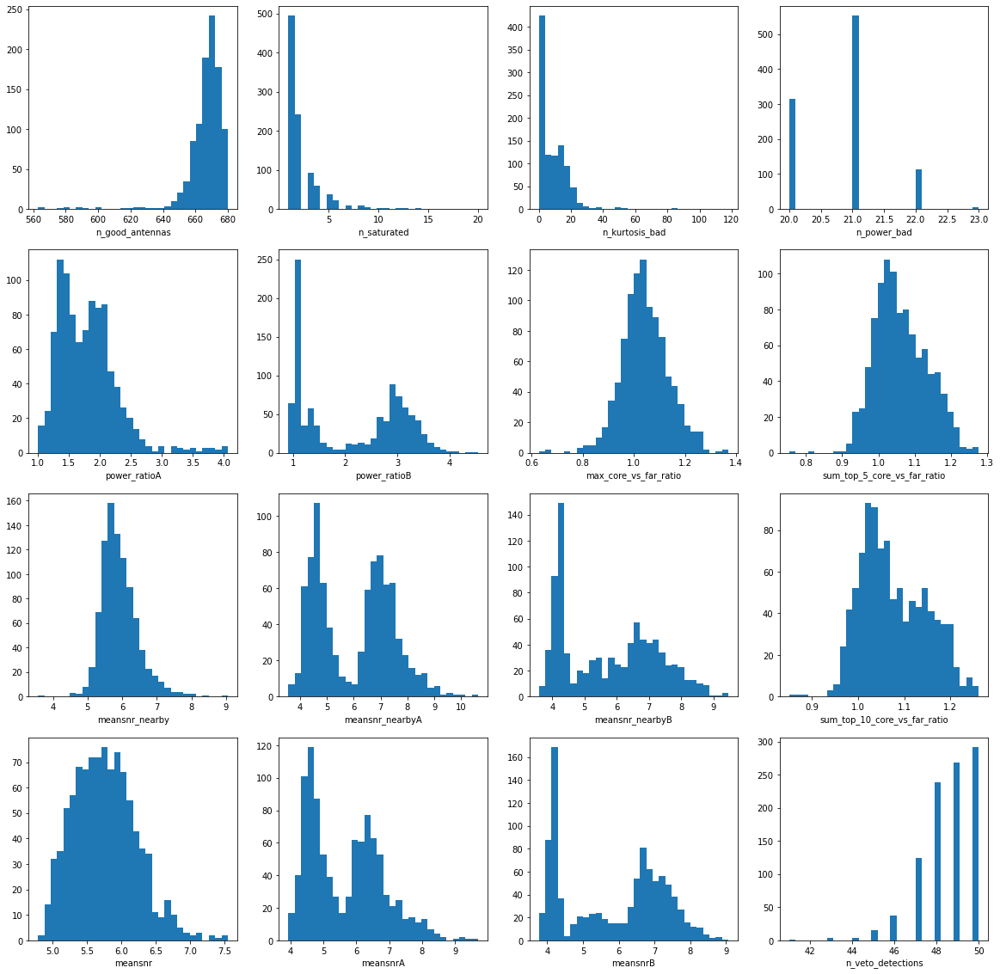

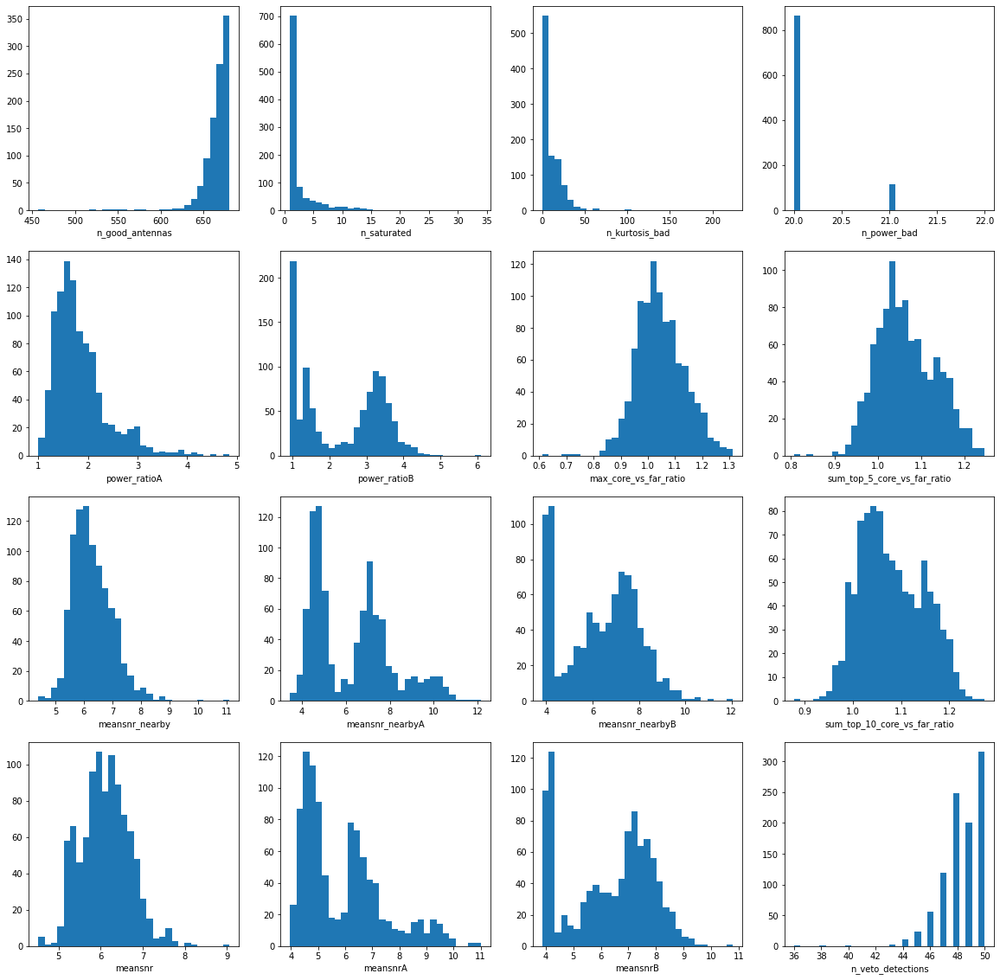

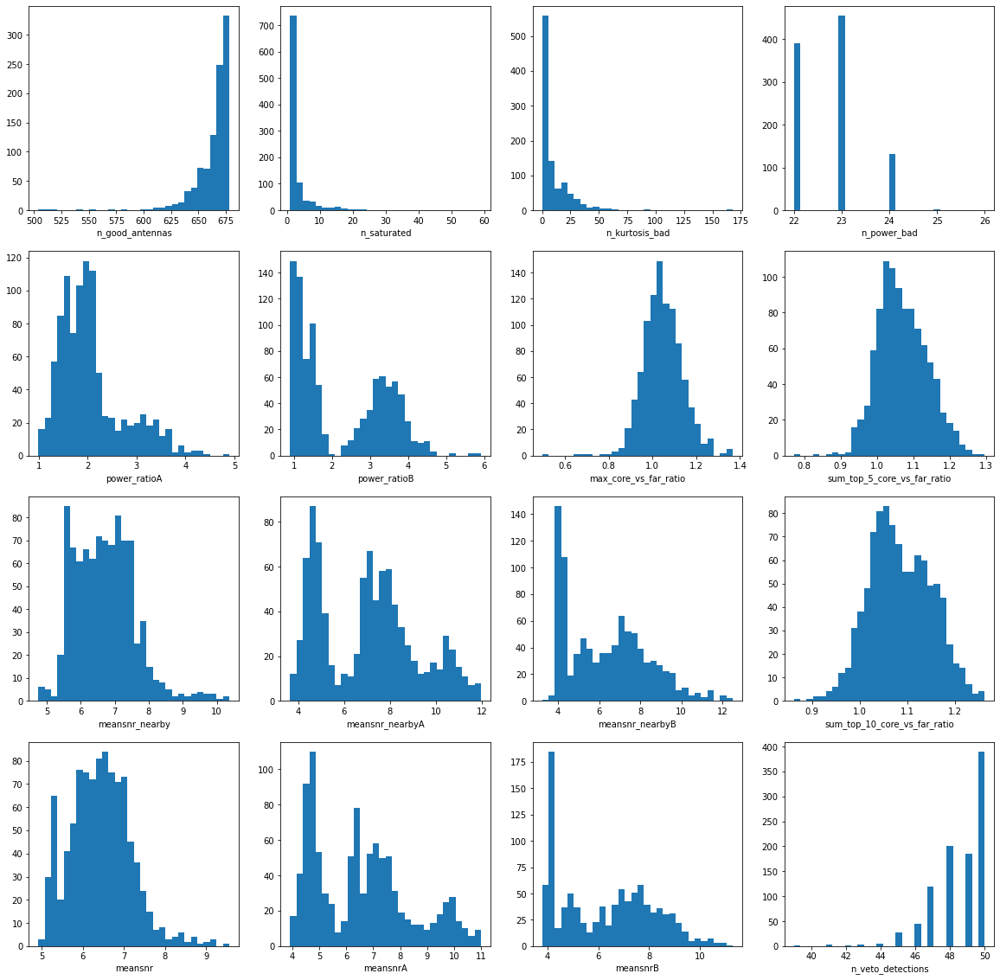

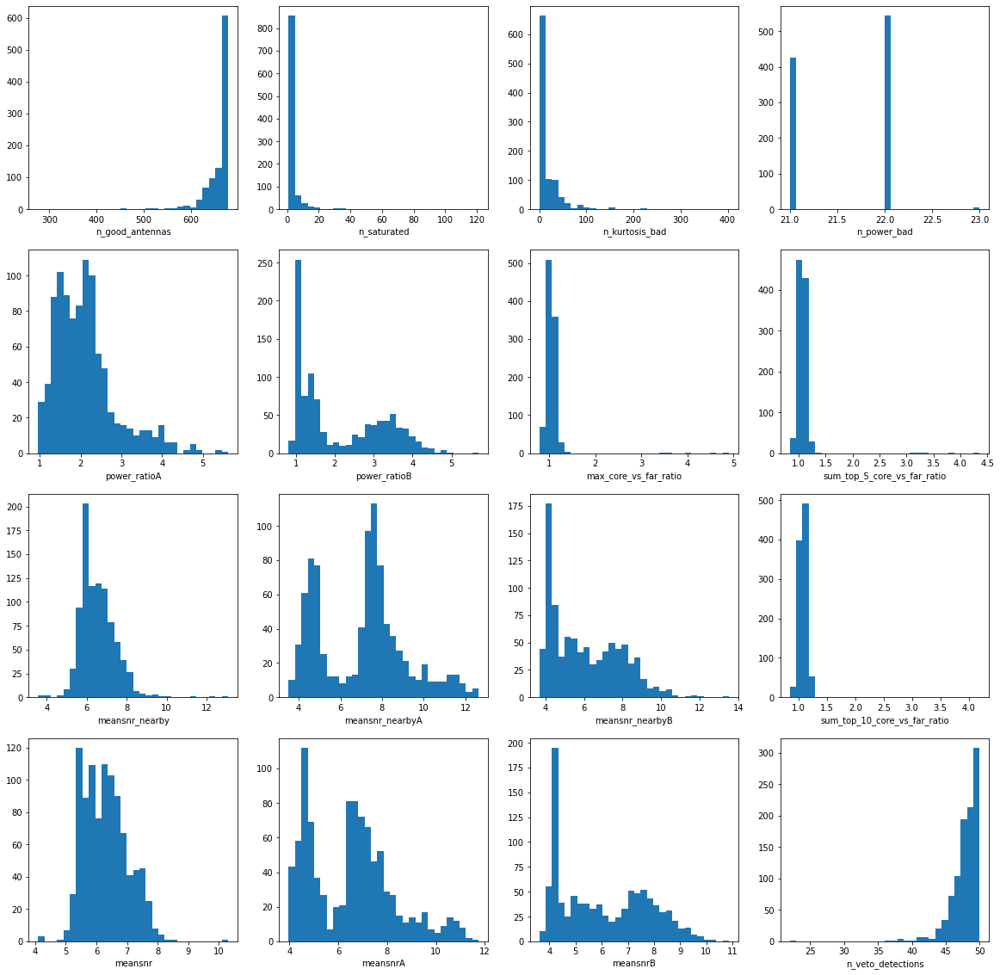

In [9]:
for f in a_few_summaries:
    example=np.load(dataproductsdir+f)
    plothistograms(example,30)

## Merge summary arrays

### First some testing

In [10]:
test1=np.load(dataproductsdir+a_few_summaries[0])
test2=np.load(dataproductsdir+a_few_summaries[1])
test3=np.load(dataproductsdir+a_few_summaries[2])



In [11]:
print(test1.shape,test2.shape,test3.shape)

(986,) (981,) (980,)


In [12]:
test=np.concatenate([test1,test2,test3])
print(test.shape)
print(test.dtype.fields)

(2947,)
{'index_in_file': (dtype('int32'), 0), 'timestamp': (dtype('uint64'), 4), 'n_veto_detections': (dtype('uint32'), 12), 'n_good_antennas': (dtype('uint32'), 16), 'n_saturated': (dtype('uint32'), 20), 'n_kurtosis_bad': (dtype('uint32'), 24), 'n_power_bad': (dtype('uint32'), 28), 'power_ratioA': (dtype('float32'), 32), 'power_ratioB': (dtype('float32'), 36), 'max_core_vs_far_ratio': (dtype('float32'), 40), 'sum_top_5_core_vs_far_ratio': (dtype('float32'), 44), 'sum_top_10_core_vs_far_ratio': (dtype('float32'), 48), 'meansnr_nearby': (dtype('float32'), 52), 'meansnr_nearbyA': (dtype('float32'), 56), 'meansnr_nearbyB': (dtype('float32'), 60), 'meansnr': (dtype('float32'), 64), 'meansnrA': (dtype('float32'), 68), 'meansnrB': (dtype('float32'), 72)}


In [13]:
986+981+980

2947

In [14]:
#test out adding a file name field
summaryfname=a_few_summaries[0]
datafname=summaryfname[:-12]
print(summaryfname)
print(datafname)

#arr=rfn.append_fields(example,'datafname',data=np.zeros(len(example)),dtypes='U10')
arr=rfn.append_fields(test1,'datafname',data=np.asarray([datafname]*len(example)),dtypes='U100')
print(arr['datafname'][0])
print(arr.dtype.fields)

overnight1691657578.6879675.dat.summary.npy
overnight1691657578.6879675.dat
overnight1691657578.6879675.dat
{'index_in_file': (dtype('int32'), 0), 'timestamp': (dtype('uint64'), 4), 'n_veto_detections': (dtype('uint32'), 12), 'n_good_antennas': (dtype('uint32'), 16), 'n_saturated': (dtype('uint32'), 20), 'n_kurtosis_bad': (dtype('uint32'), 24), 'n_power_bad': (dtype('uint32'), 28), 'power_ratioA': (dtype('float32'), 32), 'power_ratioB': (dtype('float32'), 36), 'max_core_vs_far_ratio': (dtype('float32'), 40), 'sum_top_5_core_vs_far_ratio': (dtype('float32'), 44), 'sum_top_10_core_vs_far_ratio': (dtype('float32'), 48), 'meansnr_nearby': (dtype('float32'), 52), 'meansnr_nearbyA': (dtype('float32'), 56), 'meansnr_nearbyB': (dtype('float32'), 60), 'meansnr': (dtype('float32'), 64), 'meansnrA': (dtype('float32'), 68), 'meansnrB': (dtype('float32'), 72), 'datafname': (dtype('<U100'), 76)}


986
986


(array([110., 296., 223., 217.,  84.,  26.,   5.,   9.,   7.,   9.]),
 array([1.0067179, 1.3123227, 1.6179274, 1.9235322, 2.229137 , 2.5347419,
        2.8403466, 3.1459513, 3.451556 , 3.757161 , 4.0627656],
       dtype=float32),
 <BarContainer object of 10 artists>)

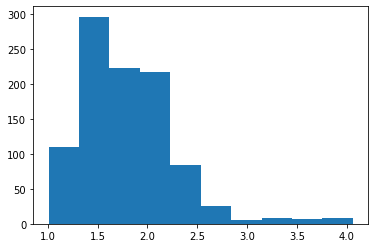

In [15]:
print(len(test1))
print(len(arr))
plt.hist(arr['power_ratioA'])

## Here is the actual merge

In [16]:
#filelist=[fname for fname in os.listdir(dataproductsdir) if (fname[:2]=='ov' and fname[-3:]=='npy')]
#arrays_to_merge=[np.load(dataproductsdir+fname) for fname in filelist]
#merged=np.concatenate(arrays_to_merge)

In [17]:
filelist=[fname for fname in os.listdir(dataproductsdir) if (fname[:2]=='ov' and fname[-3:]=='npy')]

arrays_to_merge=[]
for i in range(len(filelist)):
    #get the file name of the summary file and of the data file
    summaryfname=filelist[i]
    datafname=summaryfname[:-12]
    #load the summary array
    arr=np.load(dataproductsdir+summaryfname)
    #add a new column with the data file name
    arr2=rfn.append_fields(arr,'datafname',data=np.asarray([datafname]*len(arr)),dtypes='U100')
    #add this array to the list of arrays to merge
    arrays_to_merge.append(arr2)
    
#merge all the arrays
merged=np.concatenate(arrays_to_merge)

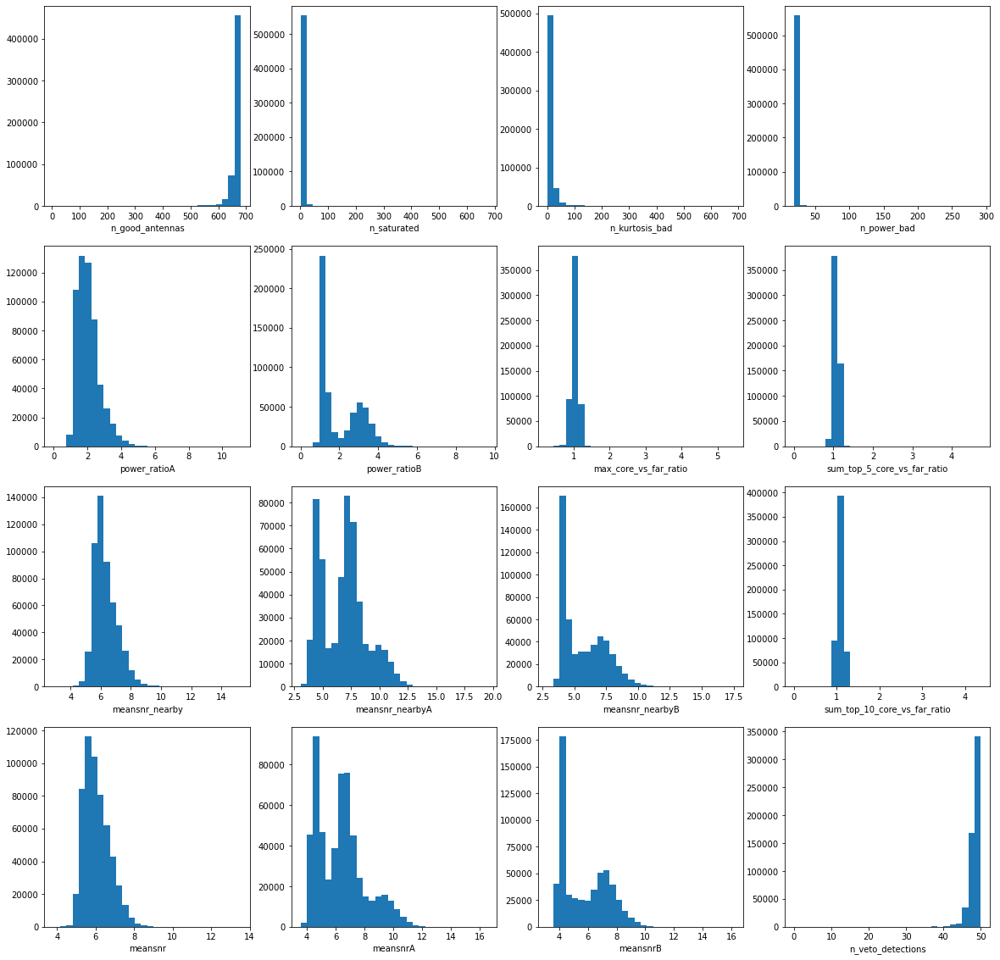

In [18]:
plothistograms(merged,30)

In [19]:
ok_kurtosis_cut1=merged['n_kurtosis_bad']<50
ok_power_cut1=merged['n_power_bad']<50
ok_saturation_cut1=merged['n_saturated']<50
total_antenna_quality1=np.logical_and(ok_kurtosis_cut1,np.logical_and(ok_power_cut1,ok_saturation_cut1))

In [20]:
after_antennas_cut1=merged[total_antenna_quality1]

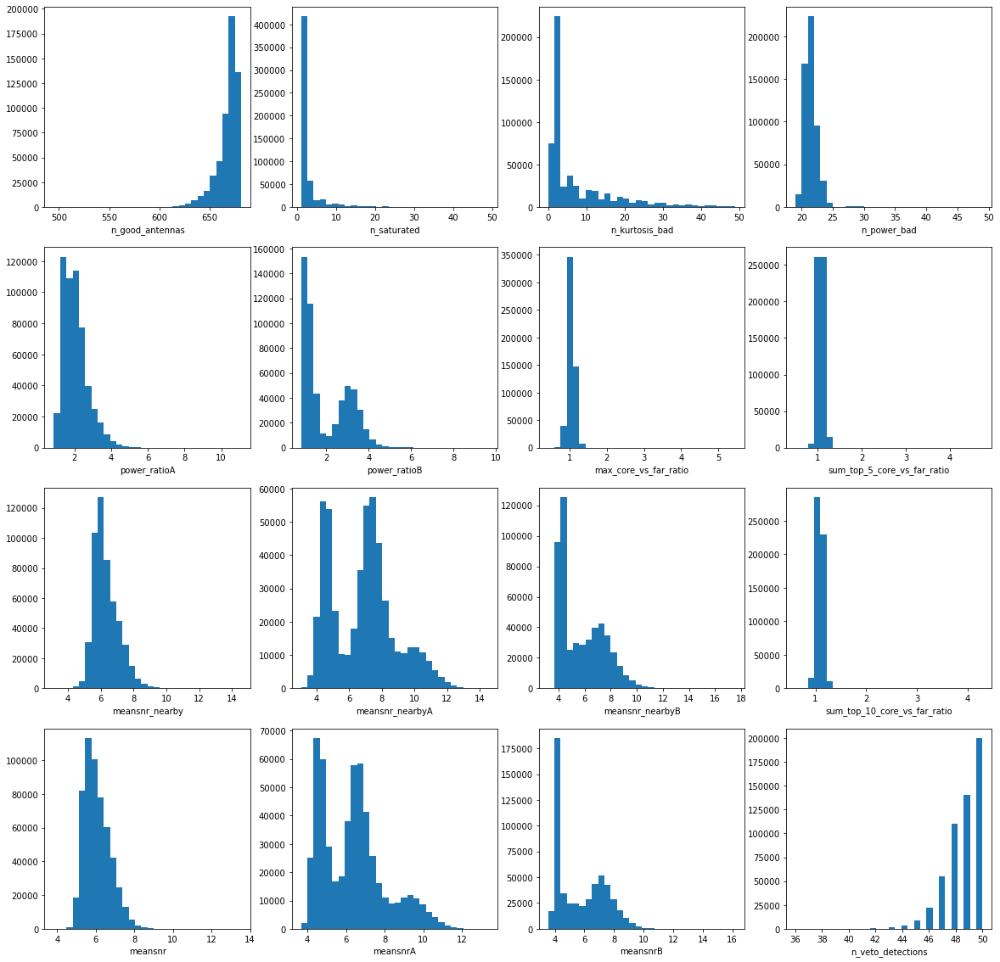

In [21]:
plothistograms(after_antennas_cut1,30)

In [22]:
impulsive_cut1=np.logical_and(after_antennas_cut1['power_ratioA']<2,after_antennas_cut1['power_ratioB']<2)
after_impulsive_cut=after_antennas_cut1[impulsive_cut1]

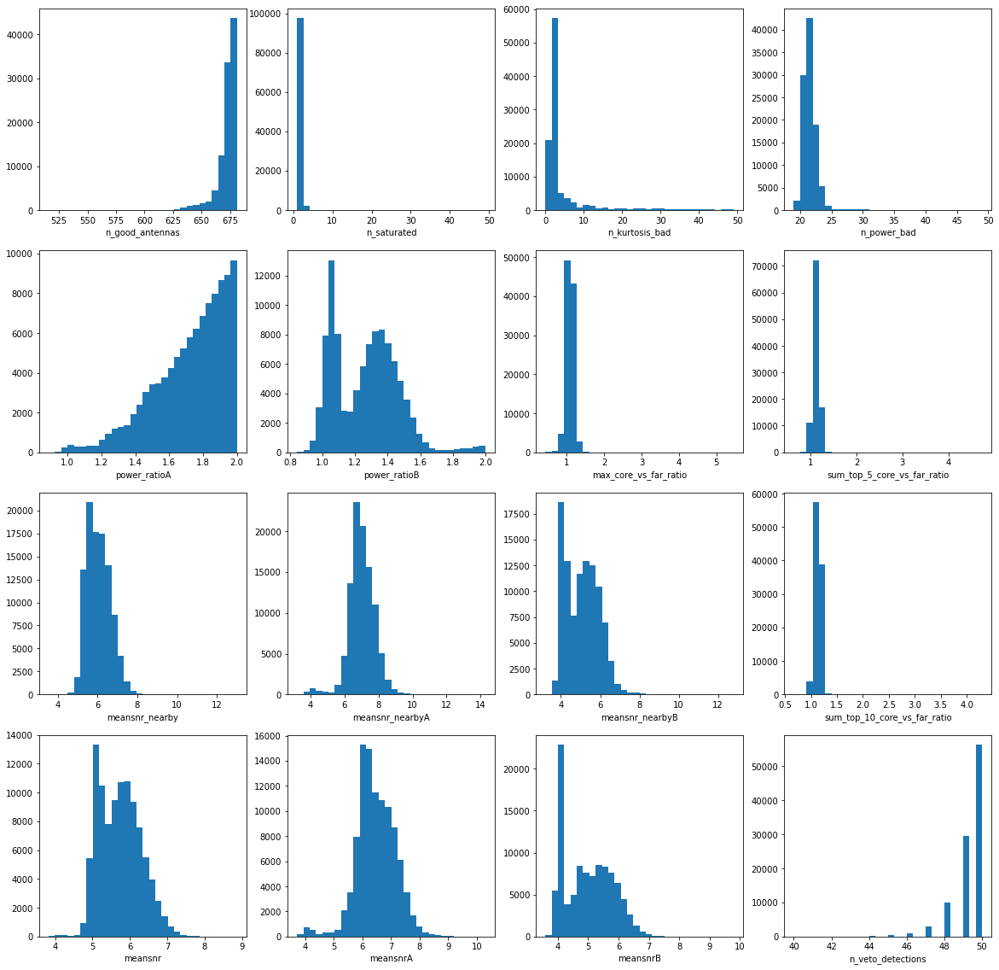

In [23]:
plothistograms(after_impulsive_cut,30)

In [24]:
impulsive_cut2=np.logical_and(after_antennas_cut1['power_ratioA']<1.2,after_antennas_cut1['power_ratioB']<1.2)
after_impulsive_cut2=after_antennas_cut1[impulsive_cut2]

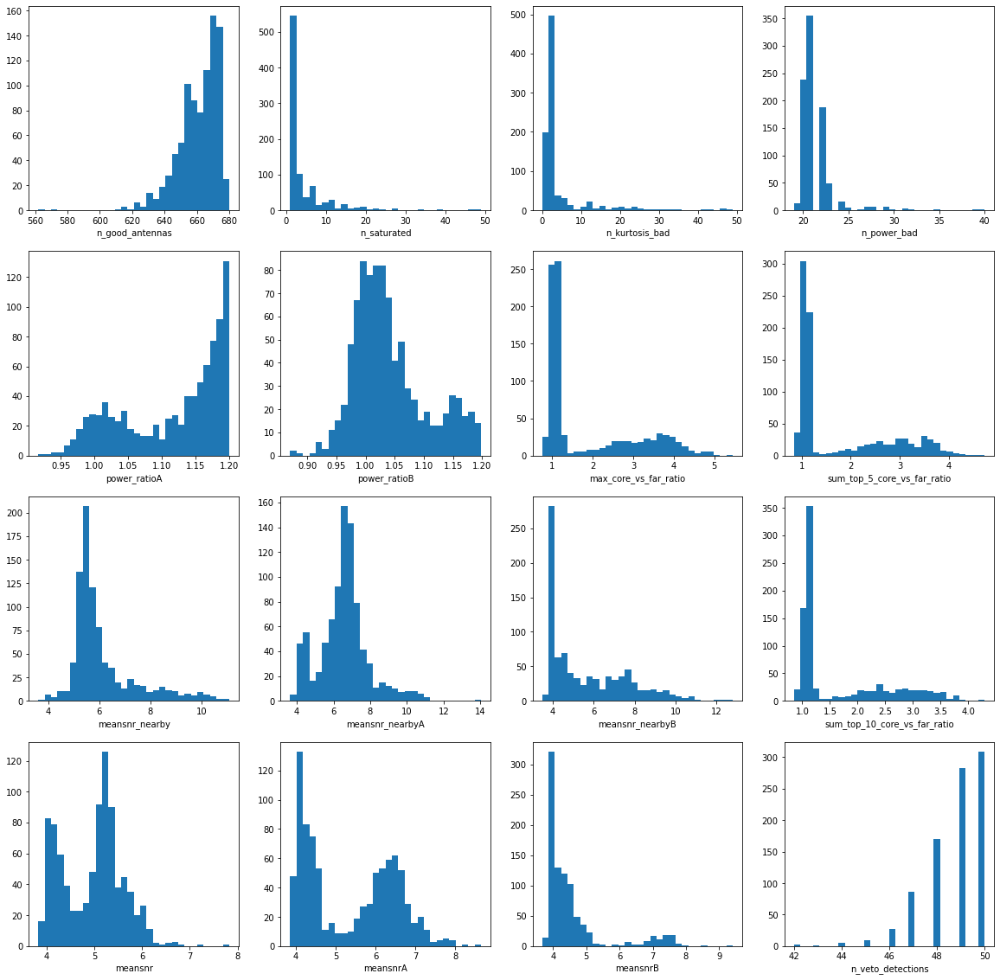

In [25]:
plothistograms(after_impulsive_cut2,30)

In [26]:
ok_kurtosis_cut2=after_impulsive_cut2['n_kurtosis_bad']<5
ok_power_cut2=after_impulsive_cut2['n_power_bad']<30
ok_saturation_cut2=after_impulsive_cut2['n_saturated']<5
total_antenna_quality2=np.logical_and(ok_kurtosis_cut2,np.logical_and(ok_power_cut2,ok_saturation_cut2))

after_antenna_quality2=after_impulsive_cut2[total_antenna_quality2]

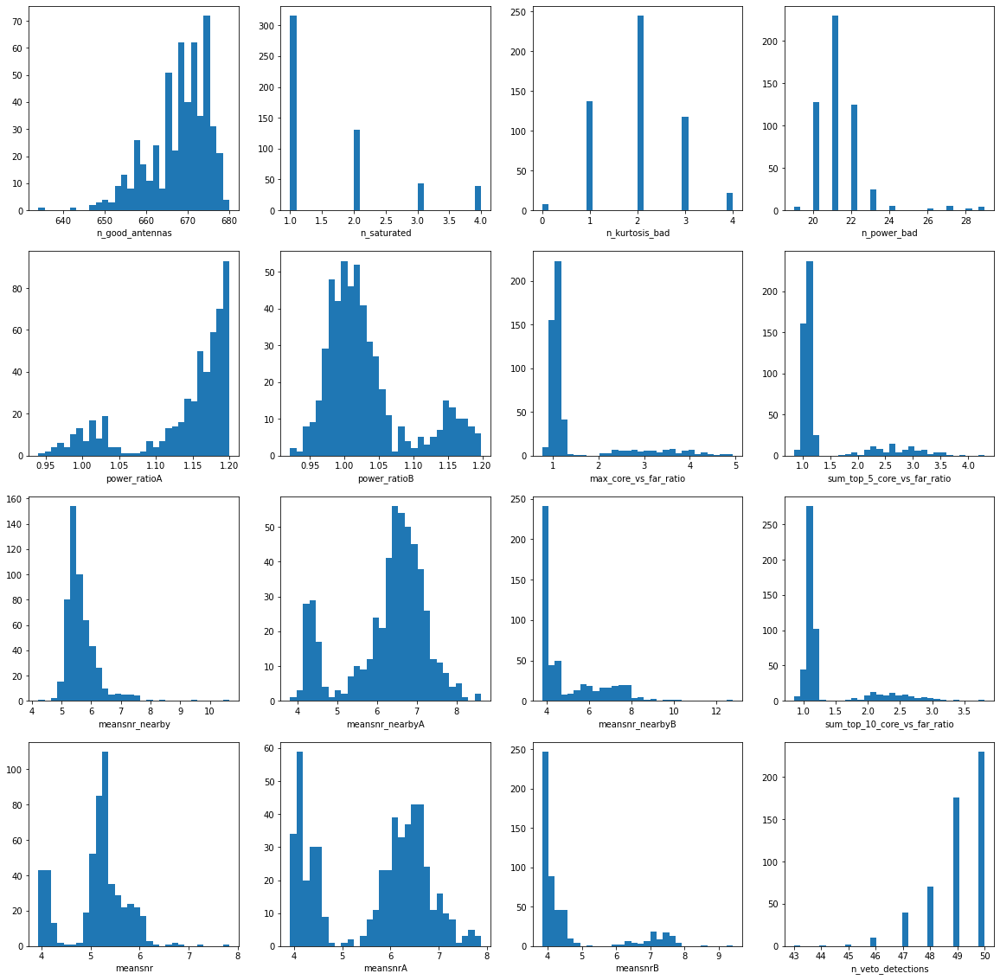

In [27]:
plothistograms(after_antenna_quality2,30)

In [28]:
impulsive_cut3=np.logical_and(after_antenna_quality2['power_ratioA']<1.1,after_antenna_quality2['power_ratioB']<1.1)
after_impulsive_cut3=after_antenna_quality2[impulsive_cut3]

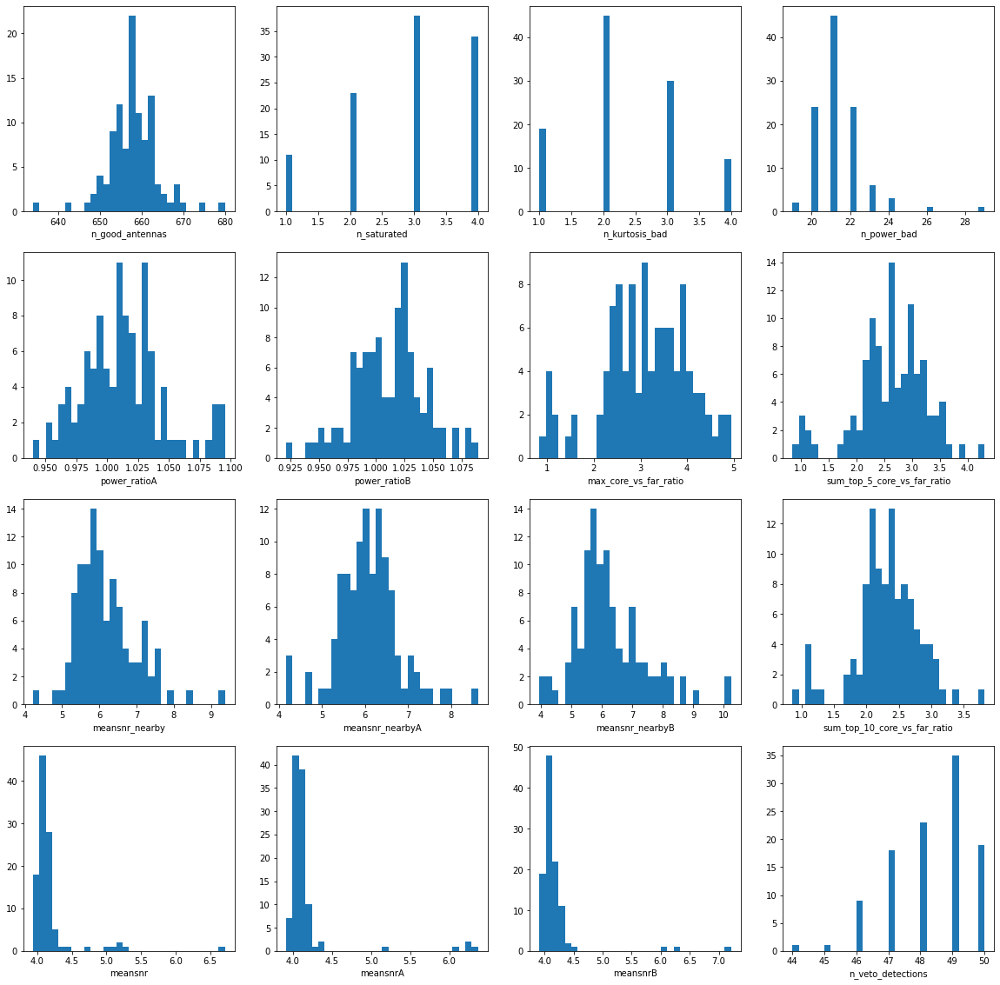

In [29]:
plothistograms(after_impulsive_cut3,30)

In [30]:
print(len(after_impulsive_cut3))

106


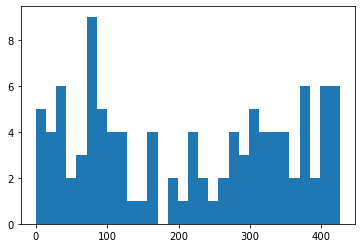

In [31]:
plt.hist((after_impulsive_cut3['timestamp']-np.min(after_impulsive_cut3['timestamp']))/(1.97e8*60),30)
plt.show()

In [32]:
print(len(merged))
impulsive_cut=np.logical_and(merged['power_ratioA']<1.1,merged['power_ratioB']<1.1)
print(len(merged[impulsive_cut]))

560653
324


## Plot all the events that passed those cuts

In [35]:
def combine_cuts(cuts):
    total_cut=cuts[0]
    for i in range(len(cuts)):
        total_cut=np.logical_and(total_cut,cuts[i])
    return total_cut
        

In [37]:
#first, I reapply the cuts more succinctly to make it easier to come back to this step
impulsive_cut_total=np.logical_and(merged['power_ratioA']<1.1,merged['power_ratioB']<1.1)
ok_kurtosis_cut_total=merged['n_kurtosis_bad']<5
ok_power_cut_total=merged['n_power_bad']<30
ok_saturation_cut_total=merged['n_saturated']<5

cuts=[impulsive_cut_total,ok_kurtosis_cut_total,ok_power_cut_total,ok_saturation_cut_total]
total_cut2=combine_cuts(cuts)

print(len(merged))
selected=merged[total_cut2]
print(len(selected))

560653
106


In [42]:
#datadir='/data0/cosmic-ray-data/2023August9/'
#config='/data0/cosmic-ray-data/2023August9-dataproducts-v4/config_preliminary_cuts.yml'
datadir='/lustre/kplant/2023August9/'
config='/lustre/kplant/2023August9-dataproducts-v4/config_preliminary_cuts.yml'

with open(config, 'r') as file:
    configuration=yaml.safe_load(file)
#array_map_filename=configuration['array_map_filename'] 
array_map_filename='/home/kplant/lwa-cosmic-rays/array-map-5-22-2023.csv'

lwa_df = reading.read_antpos_etcd()
namedict=build_mapping_dictionary(lwa_df)

array_map=pd.read_csv(array_map_filename)
xdict={}
ydict={}
zdict={}
for i,n in enumerate(array_map['antname']):
    xdict[n]=array_map['x'][i]
    ydict[n]=array_map['y'][i]
    zdict[n]=array_map['elevation'][i]
arraymapdictionaries=[xdict,ydict,zdict]

fs= 197 #MHz

In [43]:
'''for i in range(len(selected)):
    datafname=selected['datafname'][i]
    datafile=datadir+datafname
    index_in_file=selected['index_in_file'][i]
    event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
    event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
    event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                    configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],10,
['LWA-288A', 'LWA-288B', 'LWA-147A', 'LWA-147B'])[0]
    
    plt.figure(figsize=(15,7),dpi=150)
    plt.subplot(121)
    plt.title('A')
    event_scatter_plot(event_summary_flagged,'snr',-105,105,-105,105,'A',annotate=True,markerscale=10)
    plt.subplot(122)
    plt.title('B')
    event_scatter_plot(event_summary_flagged,'snr',-105,105,-105,105,'B',annotate=True,markerscale=10)
    
    a_pol_only=event_summary_flagged[event_summary_flagged['pol']=='A']
    brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
    b_pol_only=event_summary_flagged[event_summary_flagged['pol']=='B']
    brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
    print(datafname,index_in_file)
    plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
    plt.show()'''

    



"for i in range(len(selected)):\n    datafname=selected['datafname'][i]\n    datafile=datadir+datafname\n    index_in_file=selected['index_in_file'][i]\n    event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )\n    event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)\n    event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],\n                                    configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],10,\n['LWA-288A', 'LWA-288B', 'LWA-147A', 'LWA-147B'])[0]\n    \n    plt.figure(figsize=(15,7),dpi=150)\n    plt.subplot(121)\n    plt.title('A')\n    event_scatter_plot(event_summary_flagged,'snr',-105,105,-105,105,'A',annotate=True,markerscale=10)\n    plt.subplot(122)\n    plt.title('B')\n    event_scatter_plot(event_summary_flagged,'snr',-105,105,-105,105,'B',annotate=True,markerscale=10)\n    \n    a_pol_only=eve


# 9 of those are different from the others

In [44]:
interesting=[['overnight1691675085.0968647.dat', 660457],
             ['overnight1691656771.0575802.dat', 361413],
             ['overnight1691654315.0029848.dat', 535330],
             ['overnight1691653028.6510634.dat', 376117],
             ['overnight1691677510.7734604.dat', 151781 ],
             ['overnight1691653137.431842.dat', 642986 ],
             ['overnight1691652604.4974809.dat', 616979],
             ['overnight1691665332.1803102.dat', 484416],
             ['overnight1691663833.600133.dat', 547590 ]]

overnight1691675085.0968647.dat 660457


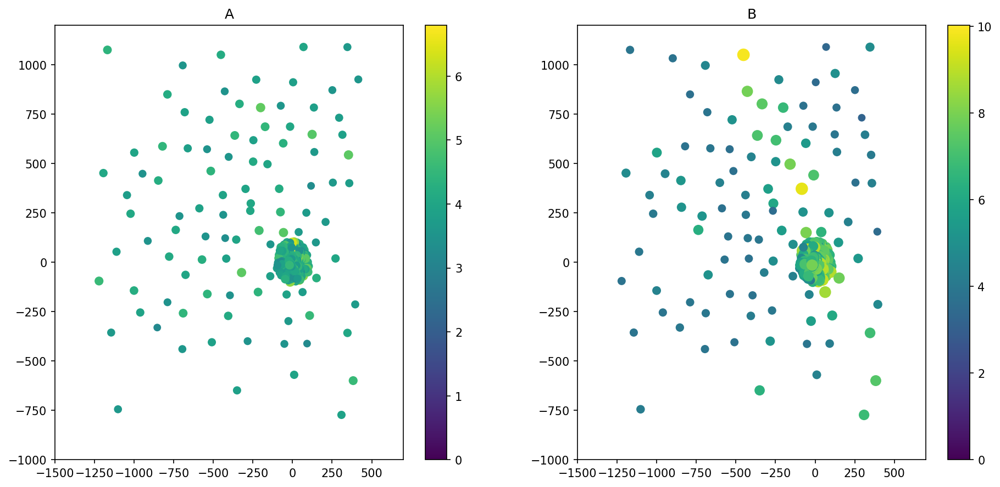

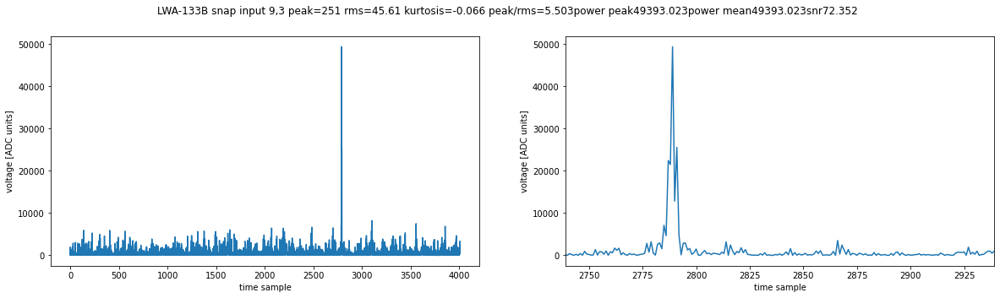

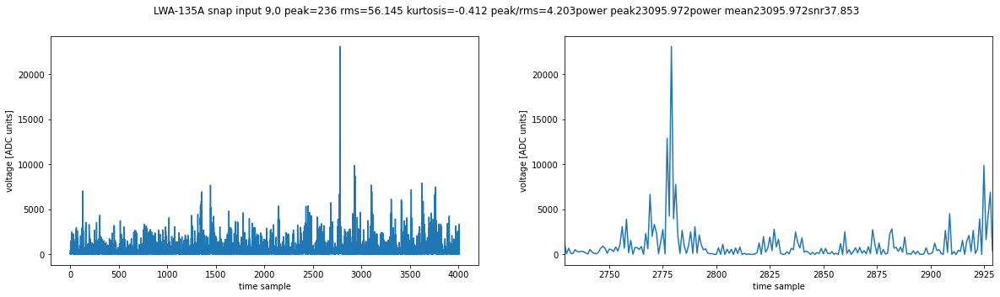

overnight1691656771.0575802.dat 361413


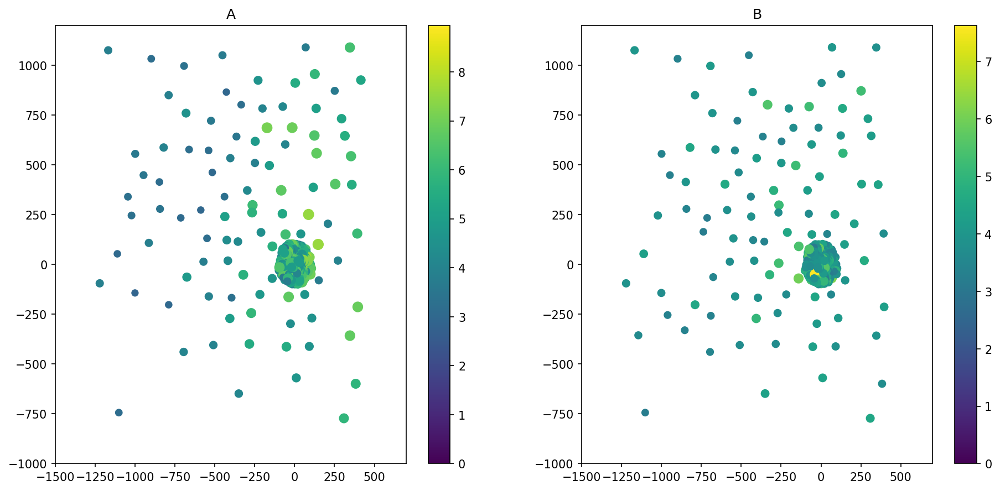

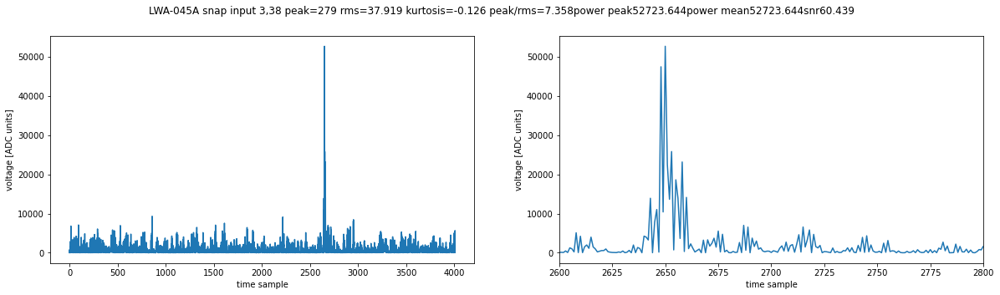

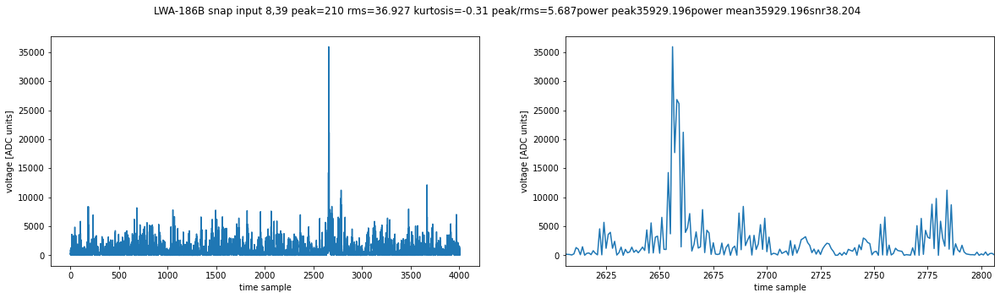

overnight1691654315.0029848.dat 535330


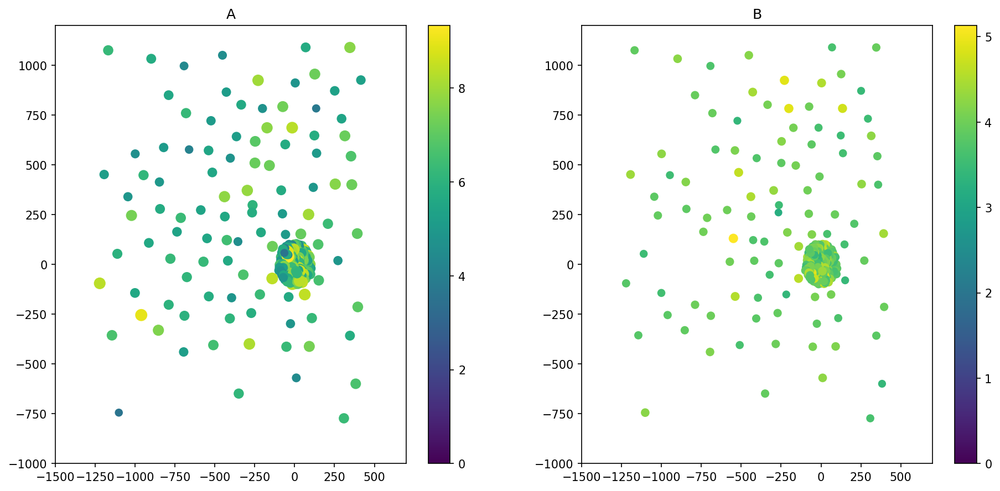

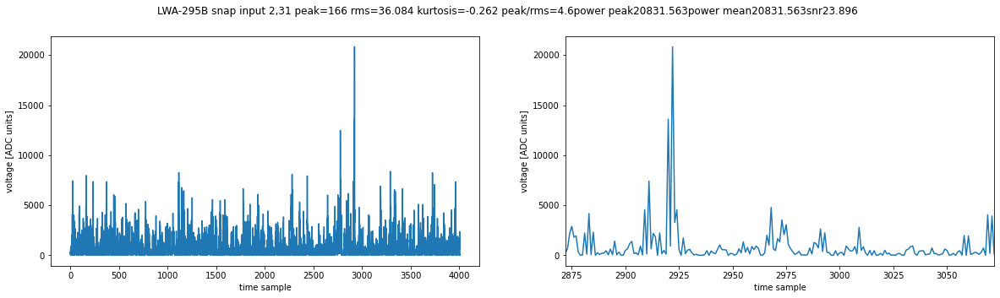

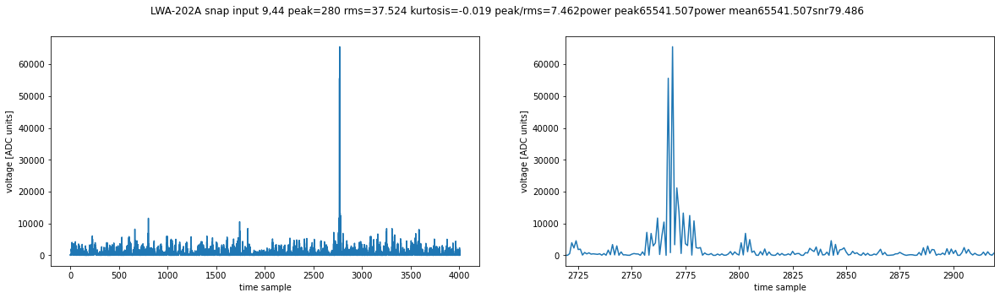

overnight1691653028.6510634.dat 376117


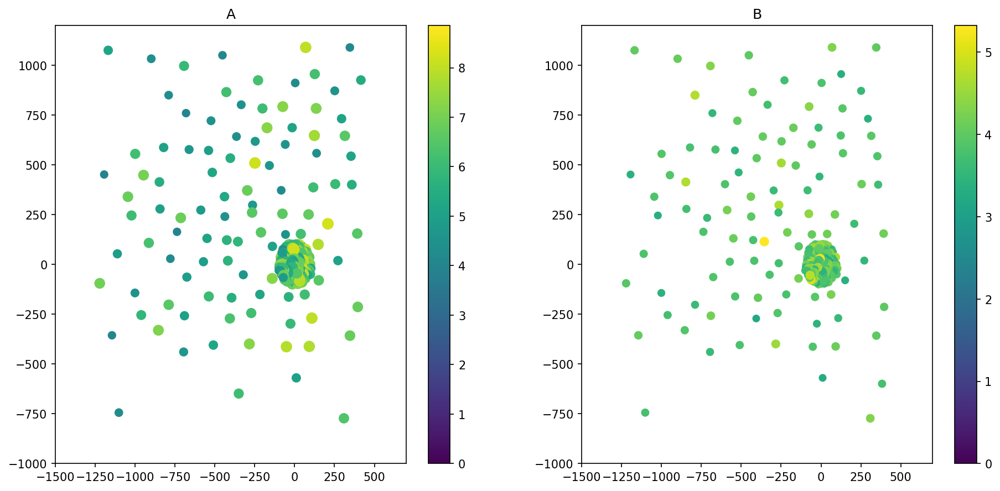

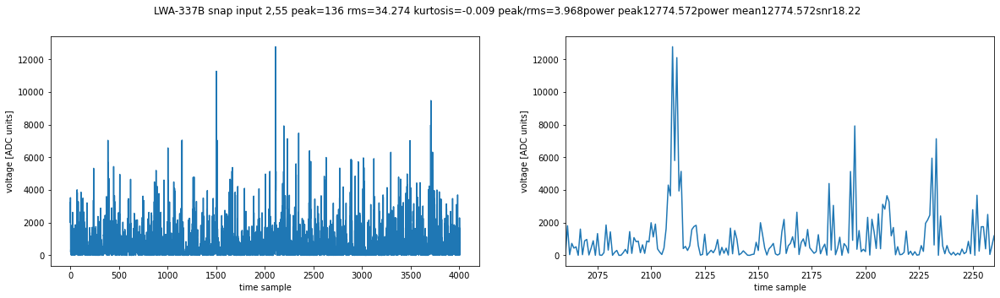

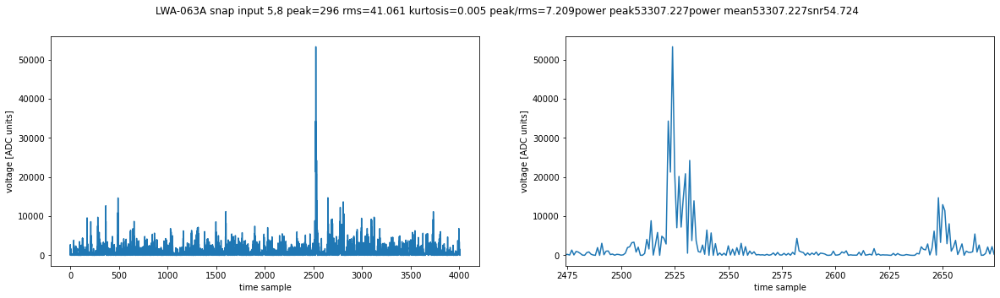

overnight1691677510.7734604.dat 151781


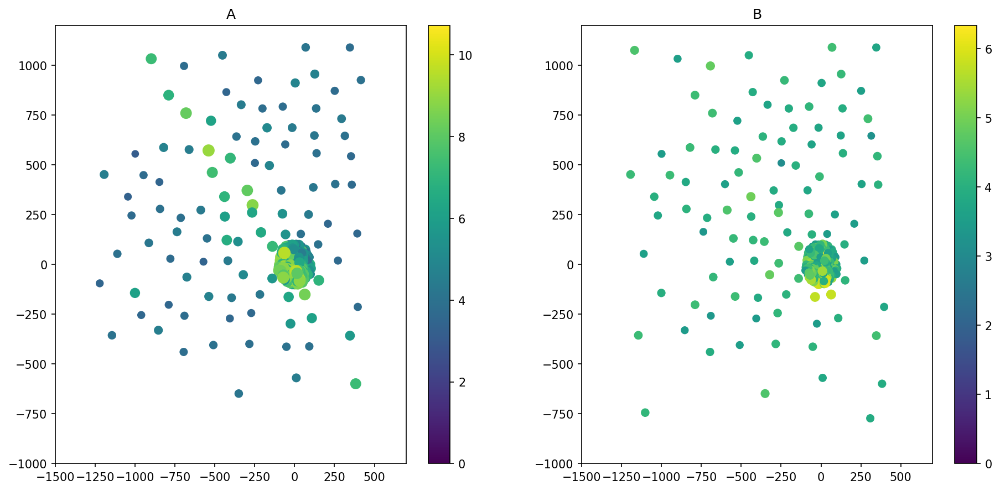

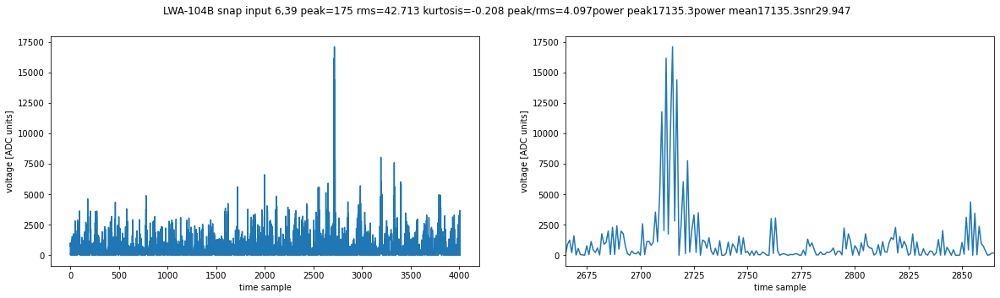

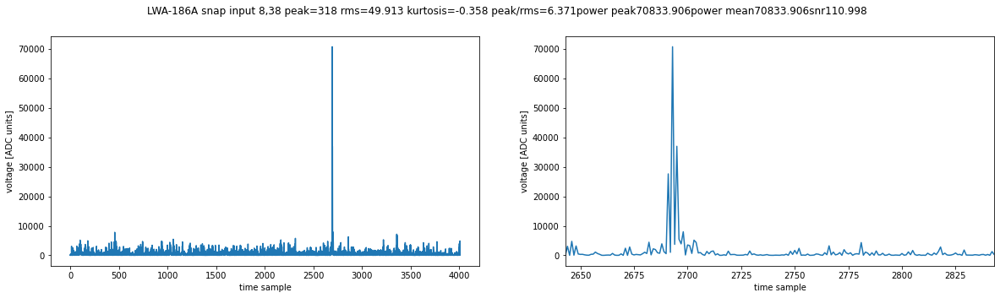

overnight1691653137.431842.dat 642986


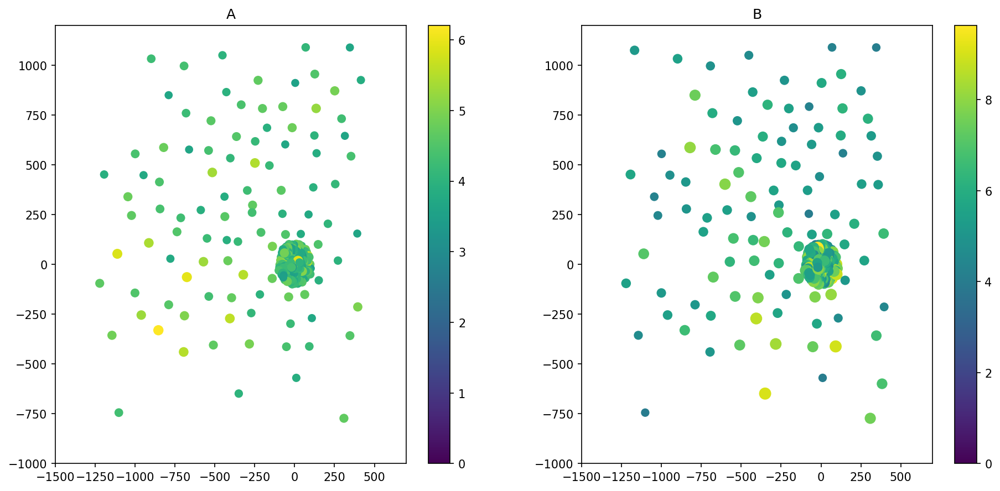

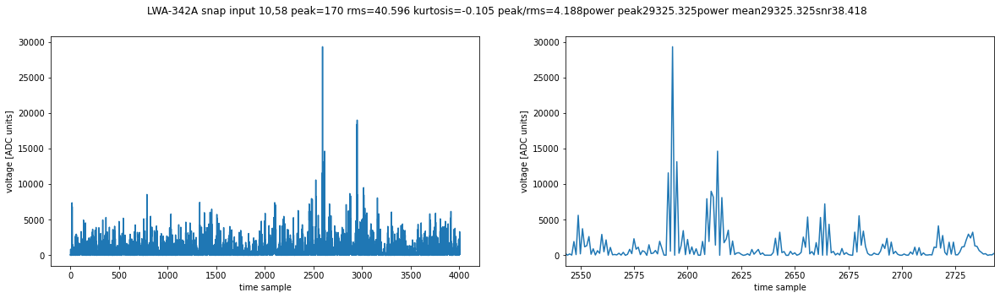

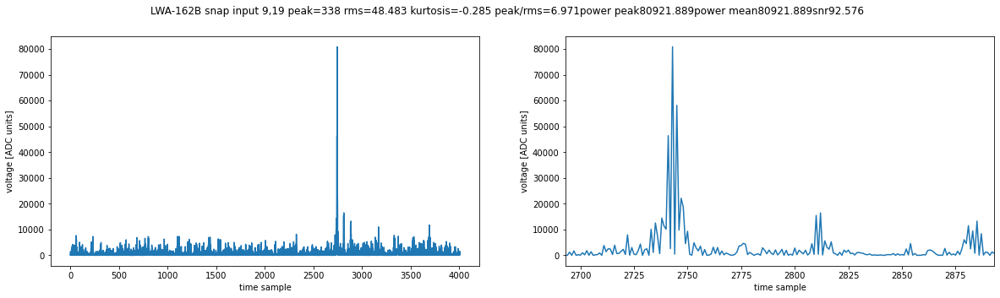

overnight1691652604.4974809.dat 616979


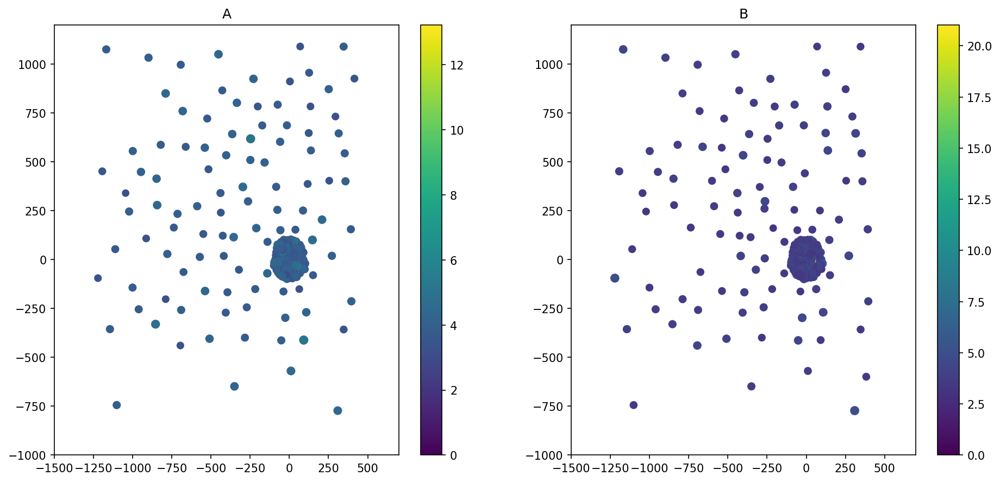

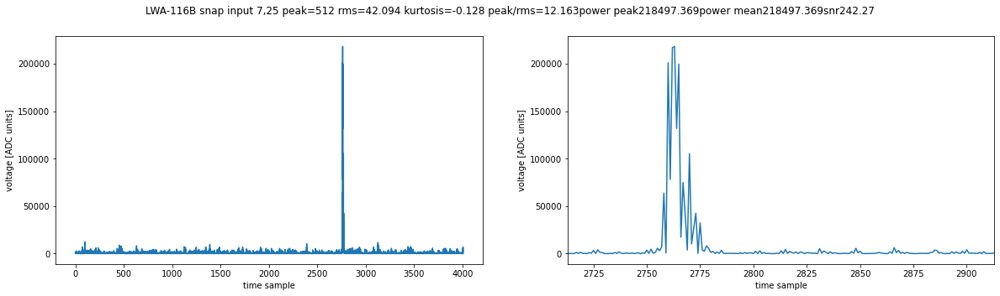

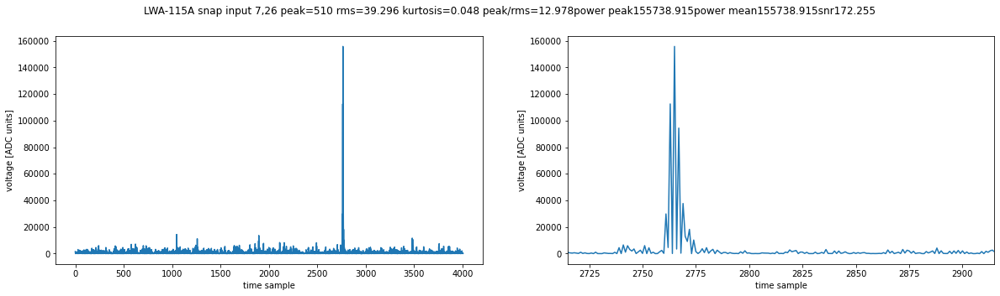

overnight1691665332.1803102.dat 484416


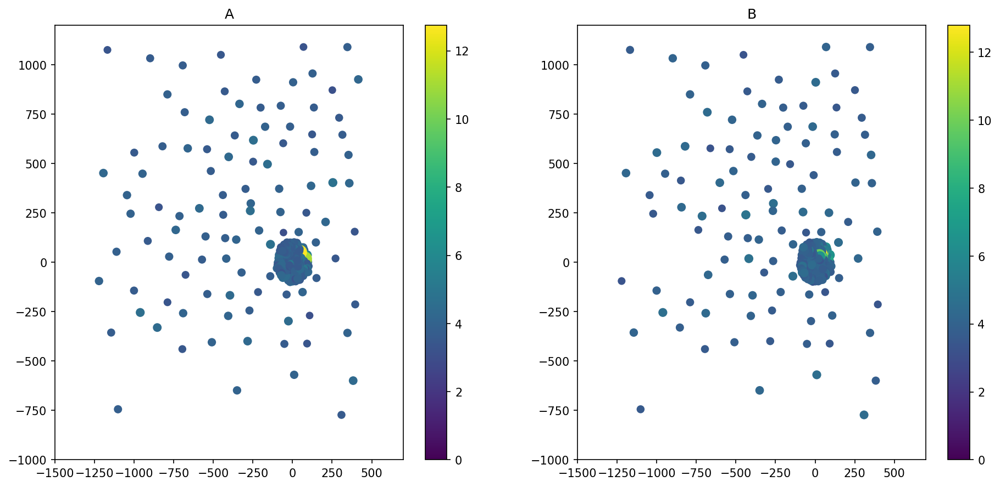

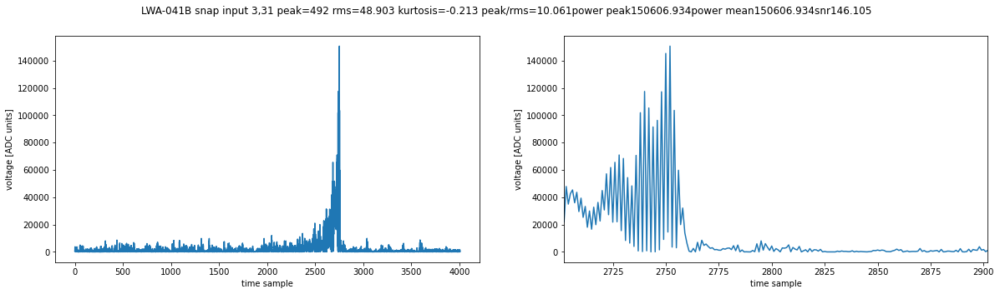

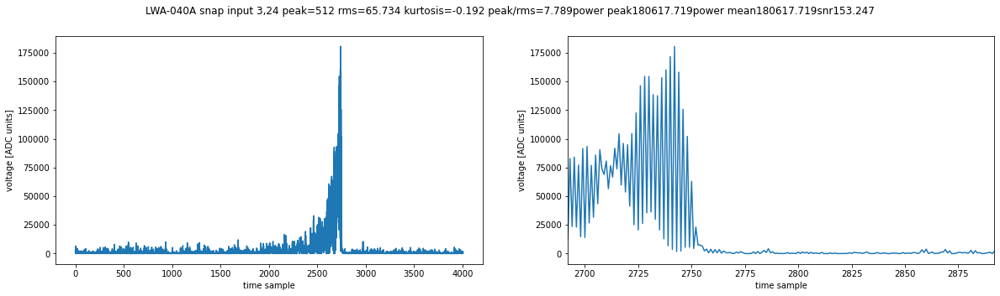

overnight1691663833.600133.dat 547590


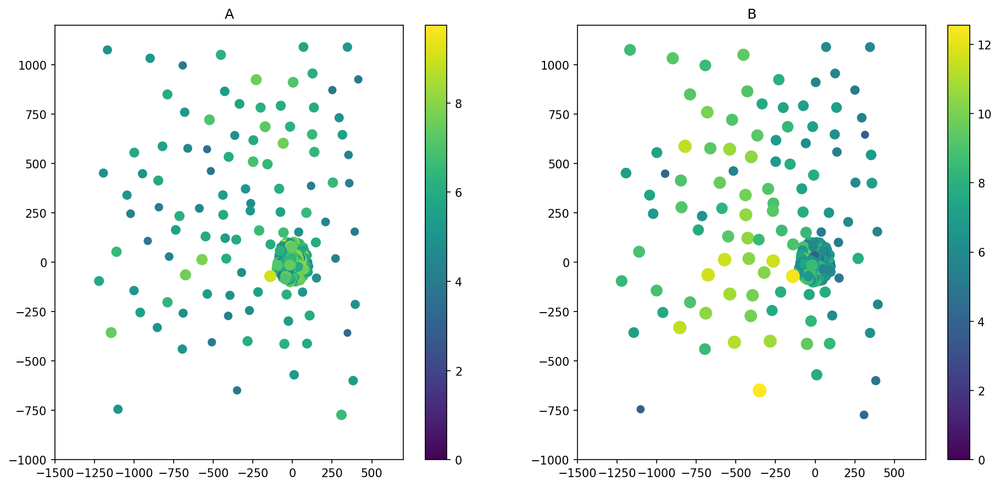

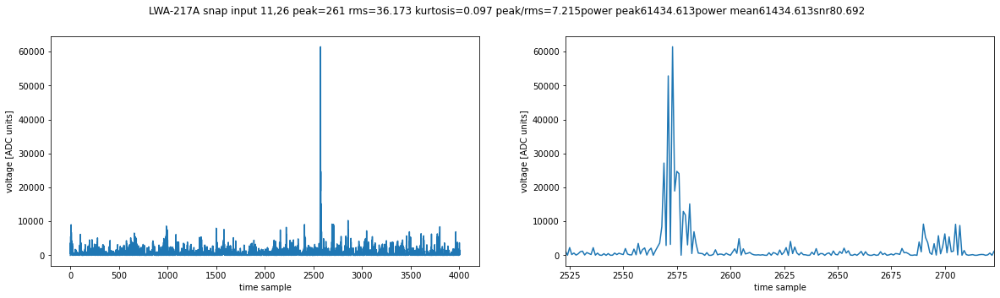

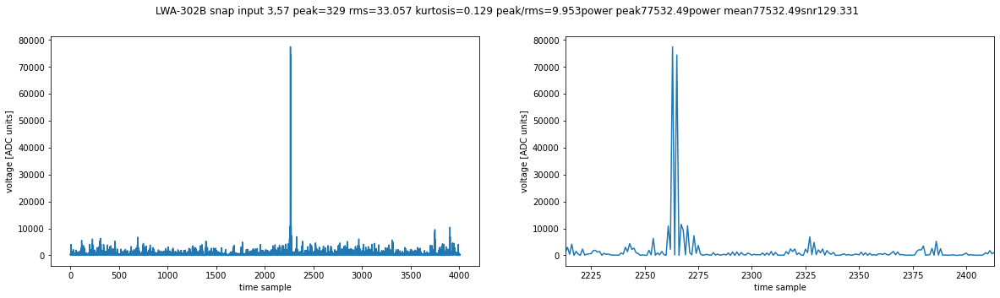

In [45]:
for i in range(len(interesting)):
    datafname=interesting[i][0]
    datafile=datadir+datafname
    index_in_file=interesting[i][1]
    event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
    event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
    event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                    configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],10,
['LWA-288A', 'LWA-288B', 'LWA-147A', 'LWA-147B'])[0]
    
    plt.figure(figsize=(15,7),dpi=150)
    plt.subplot(121)
    plt.title('A')
    event_scatter_plot(event_summary_flagged,'snr',-1500,700,-1000,1200,'A',annotate=False,markerscale=10)

    plt.subplot(122)
    plt.title('B')
    event_scatter_plot(event_summary_flagged,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10)
    
    a_pol_only=event_summary_flagged[event_summary_flagged['pol']=='A']
    brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
    b_pol_only=event_summary_flagged[event_summary_flagged['pol']=='B']
    brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
    print(datafname,index_in_file)
    plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
    plt.show()

overnight1691675085.0968647.dat 660457


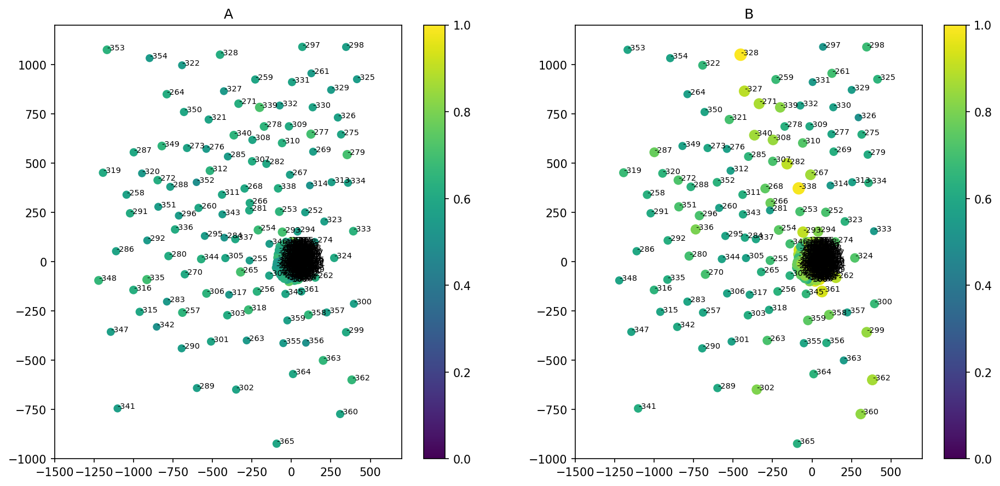

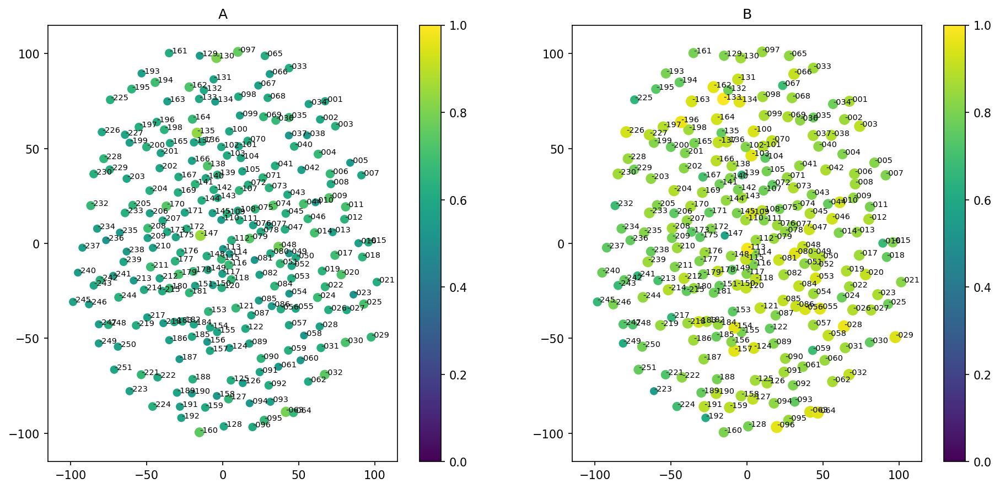

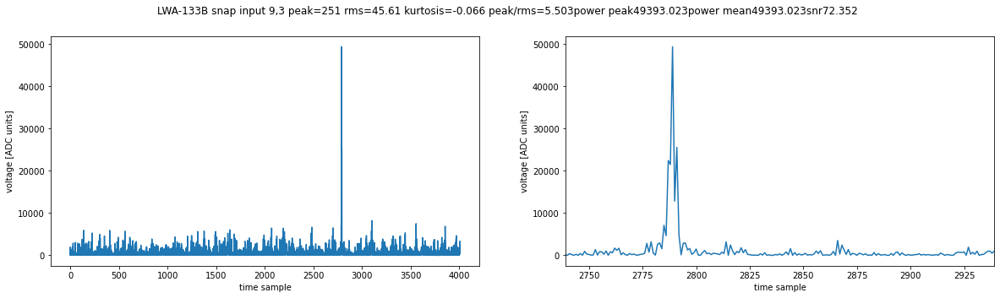

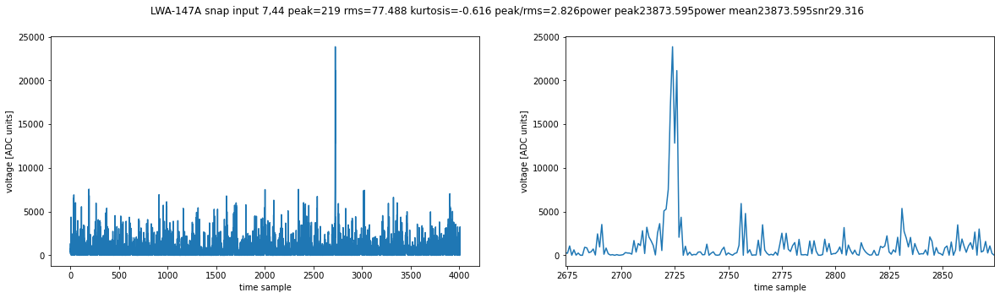

In [46]:
i=0
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=True,markerscale=10,scale='log',colorlimits=[0,1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=True,markerscale=10,scale='log',colorlimits=[0,1])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=True,markerscale=10,scale='log',colorlimits=[0,1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=True,markerscale=10,scale='log',colorlimits=[0,1])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

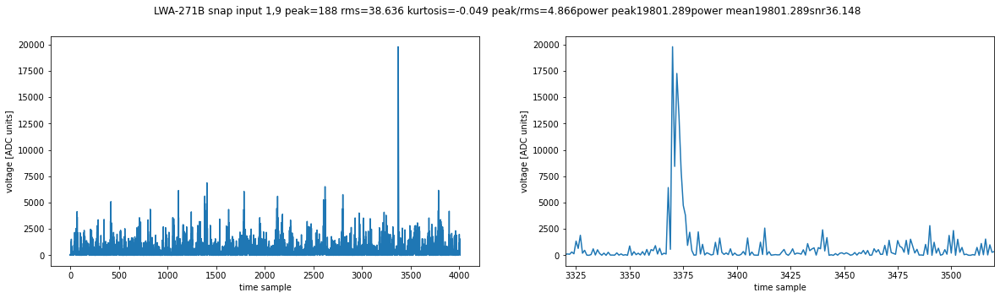

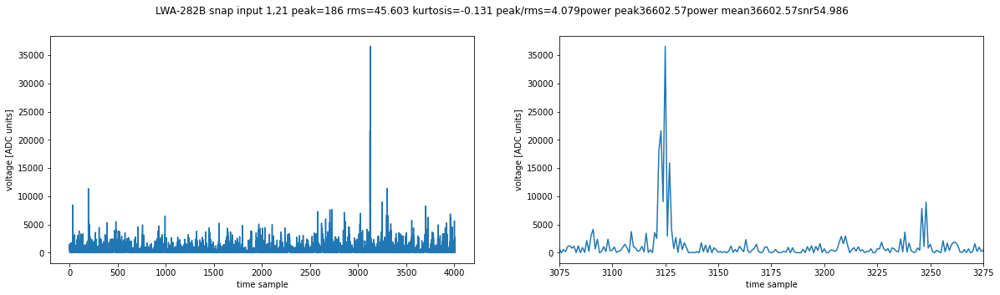

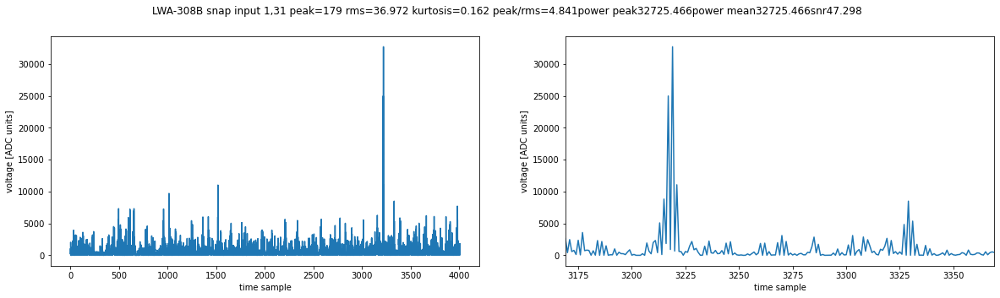

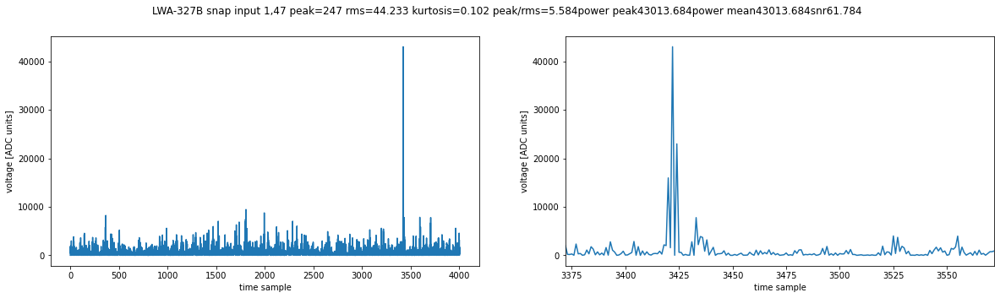

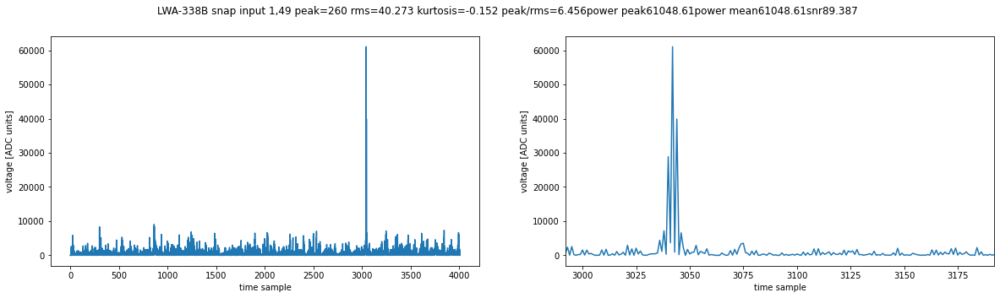

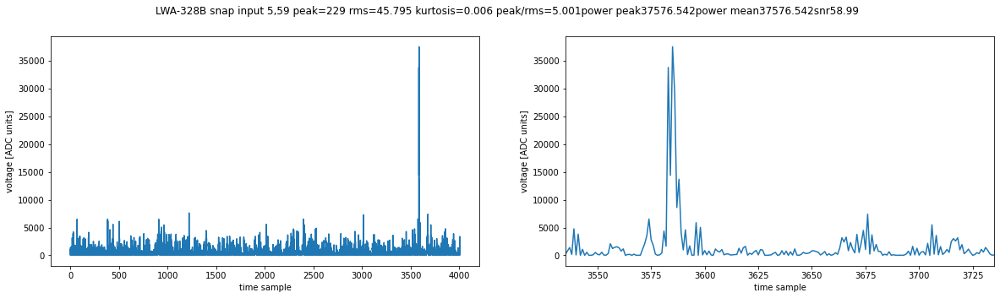

In [47]:
plot_power_timeseries(event_records,['LWA-328B','LWA-327B','LWA-271B','LWA-308B','LWA-282B','LWA-338B','LWA-361'],zoom='peak',Filter1=configuration['filter'],Filter2='None')


overnight1691656771.0575802.dat 361413


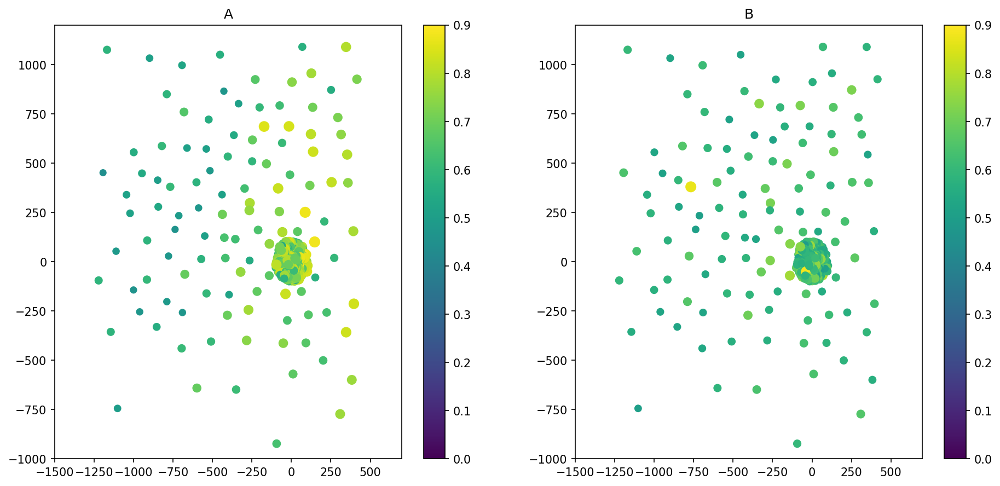

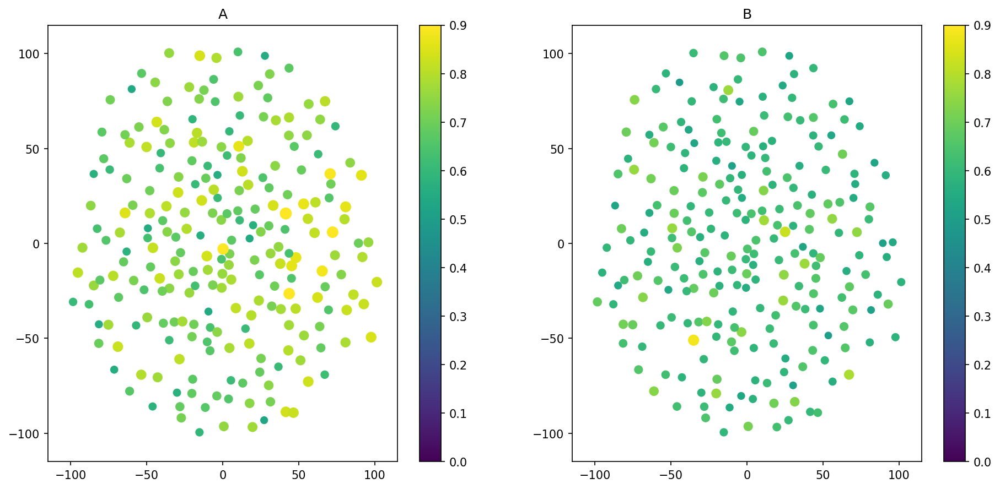

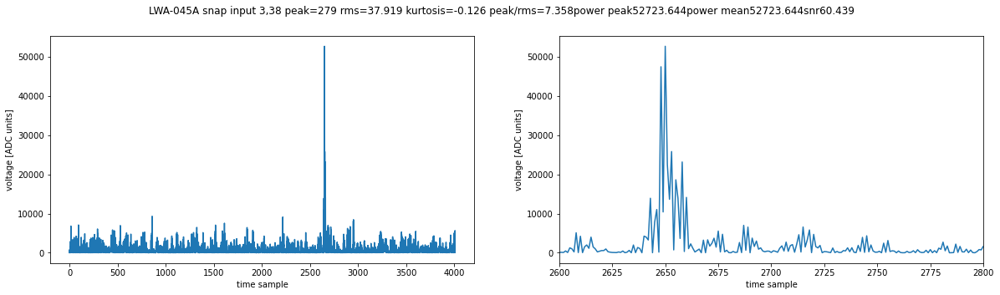

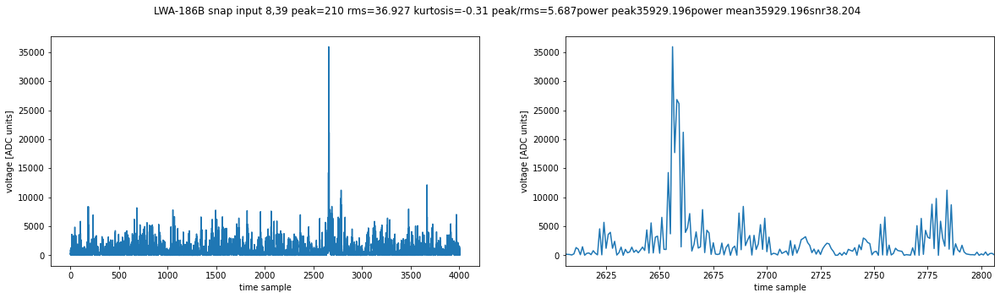

In [48]:
i=1
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,0.9])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,0.9])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,0.9])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,0.9])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

overnight1691654315.0029848.dat 535330


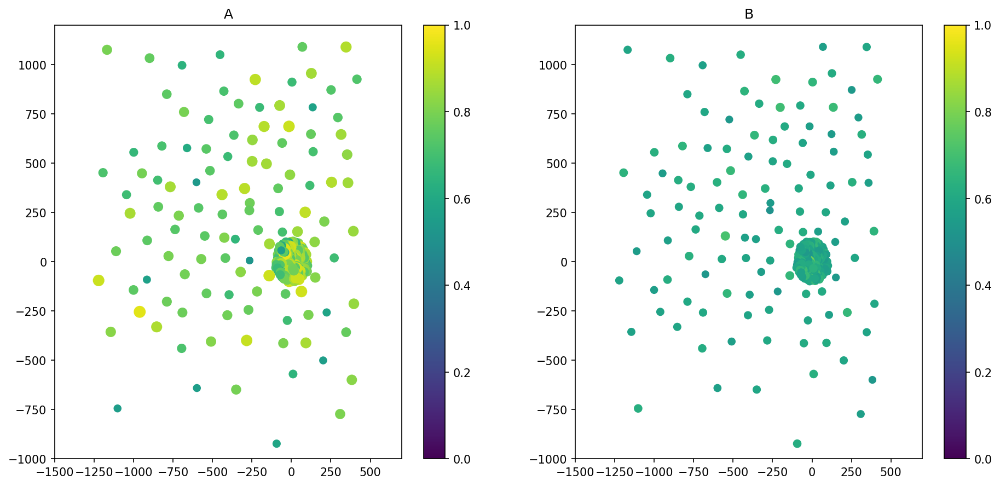

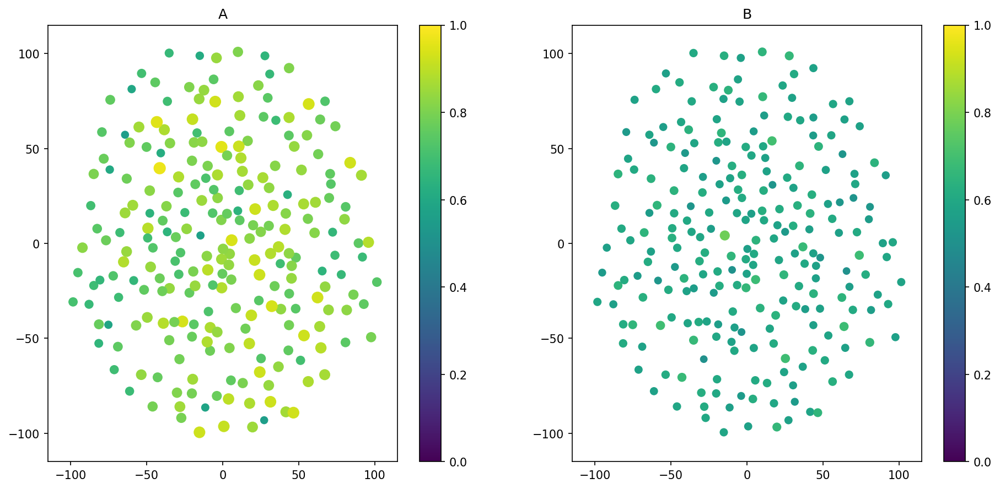

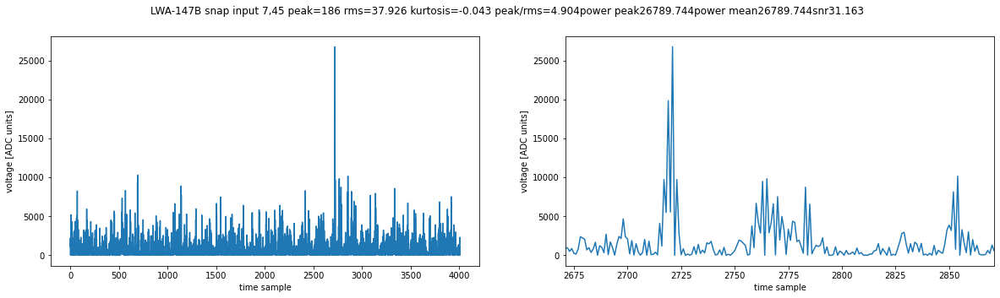

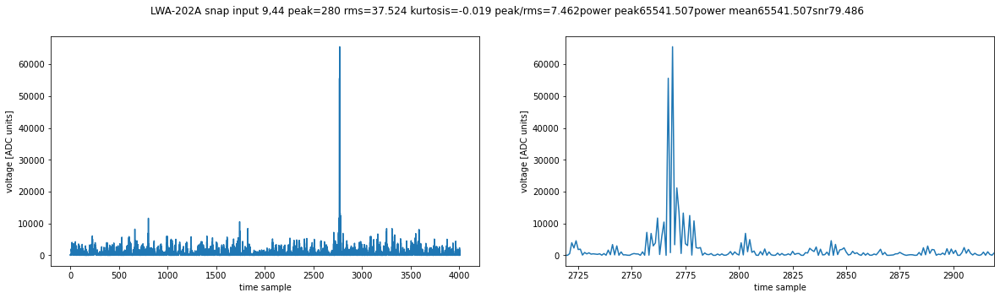

In [49]:
i=2
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

overnight1691653028.6510634.dat 376117


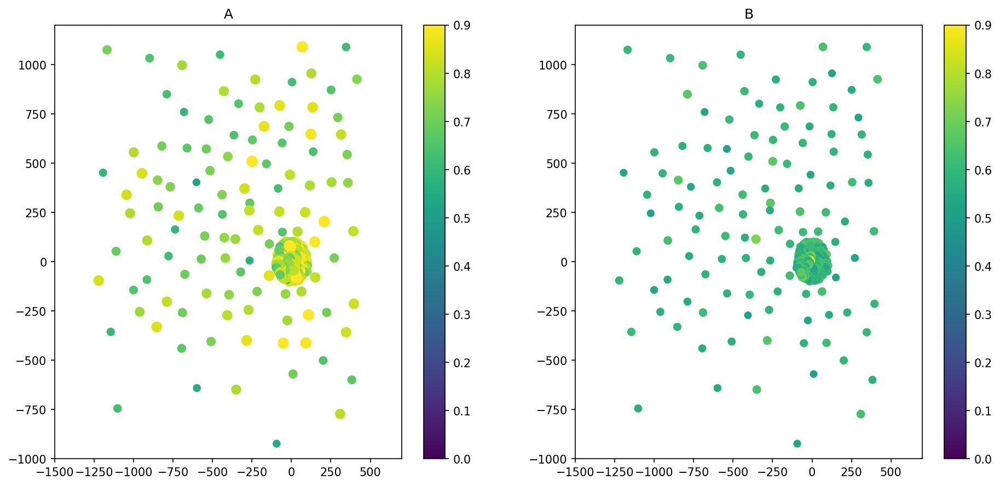

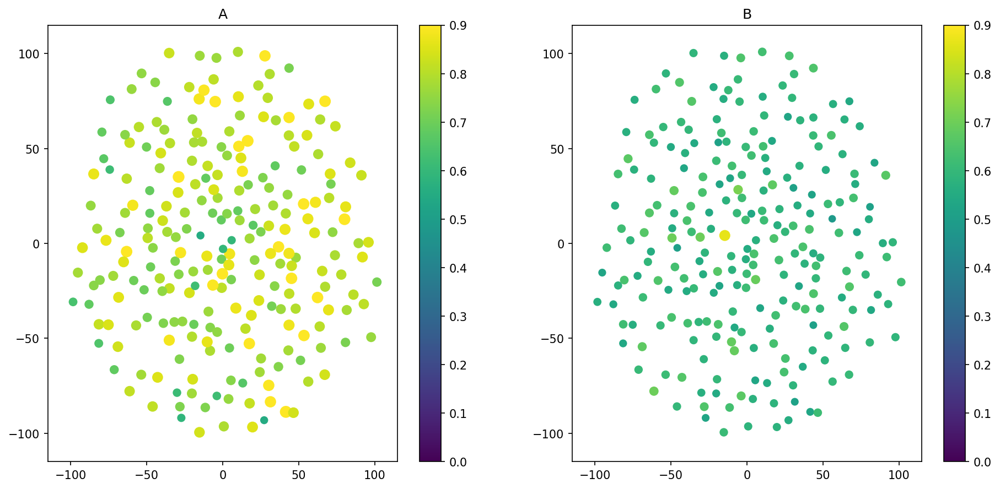

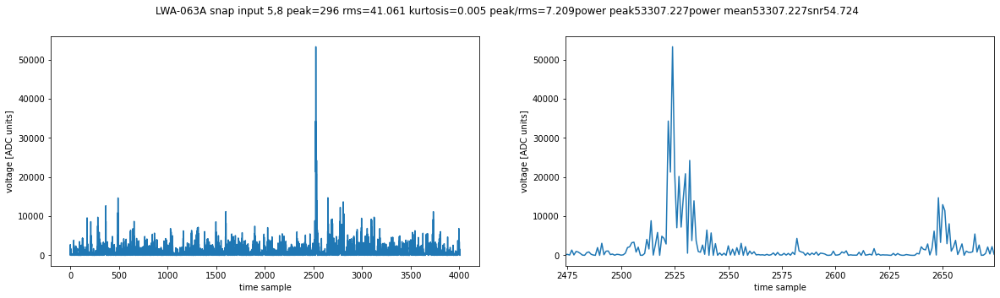

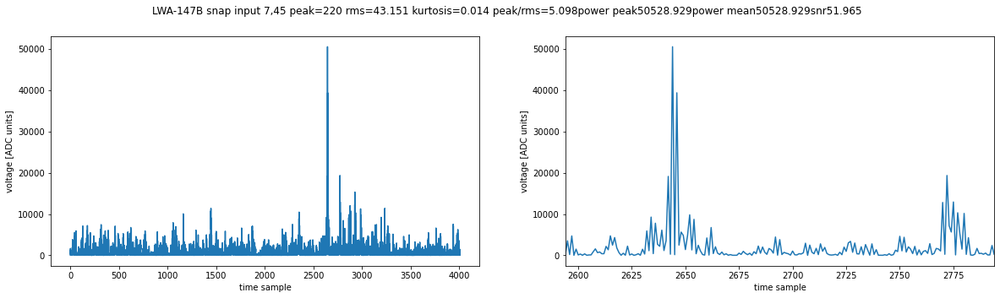

In [50]:
i=3
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,0.9])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,0.9])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,0.9])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,0.9])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

overnight1691677510.7734604.dat 151781


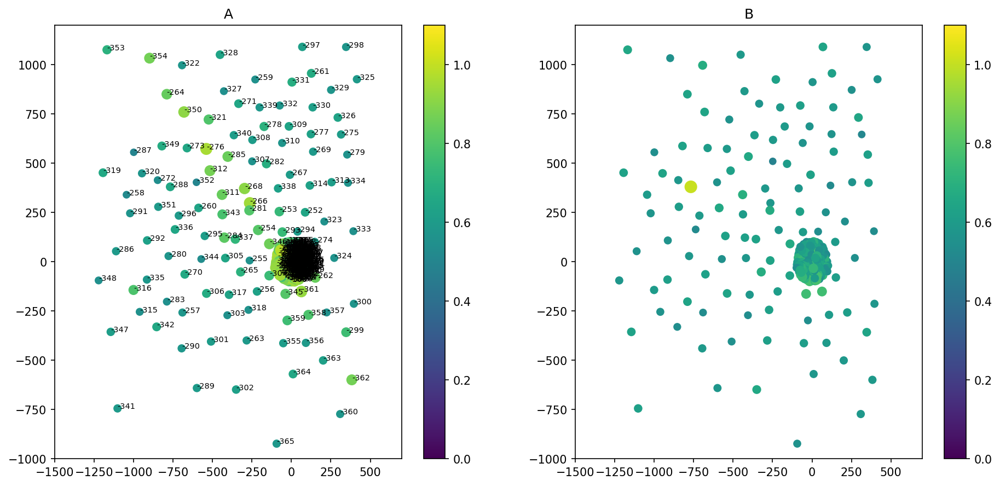

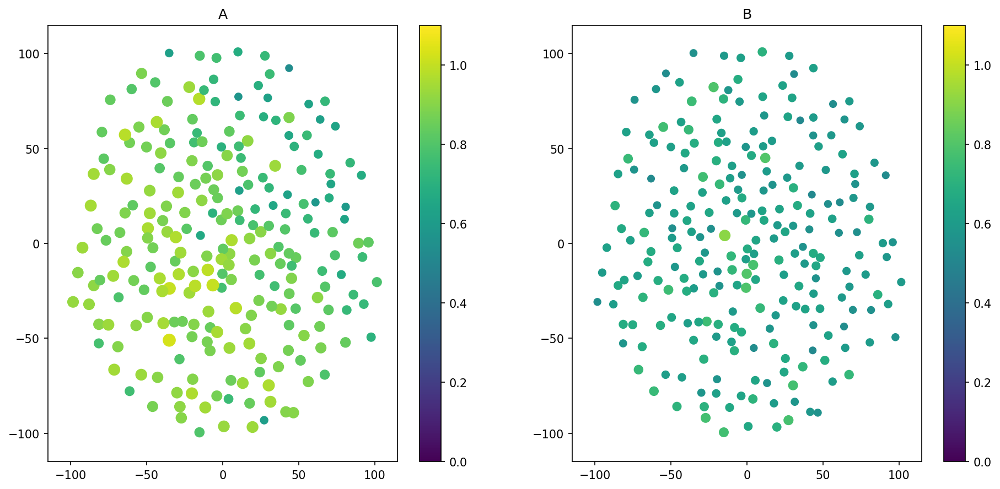

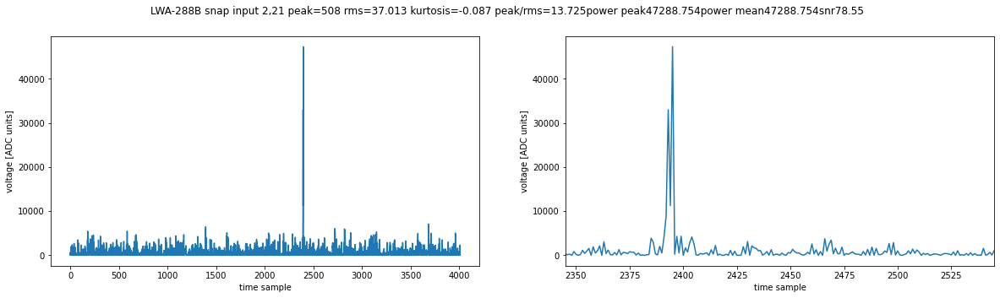

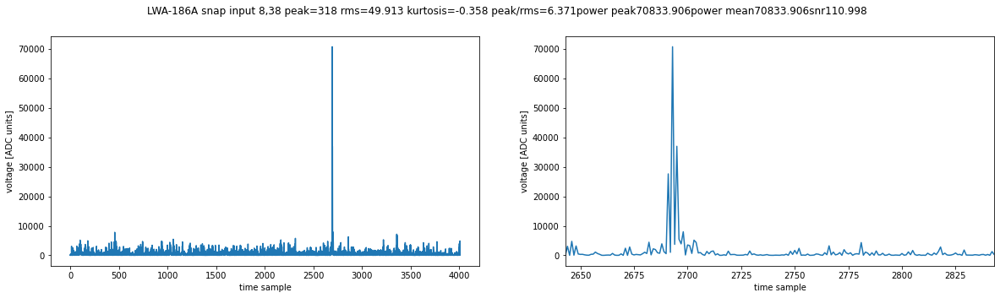

In [51]:
i=4
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=True,markerscale=10,scale='log',colorlimits=[0,1.1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

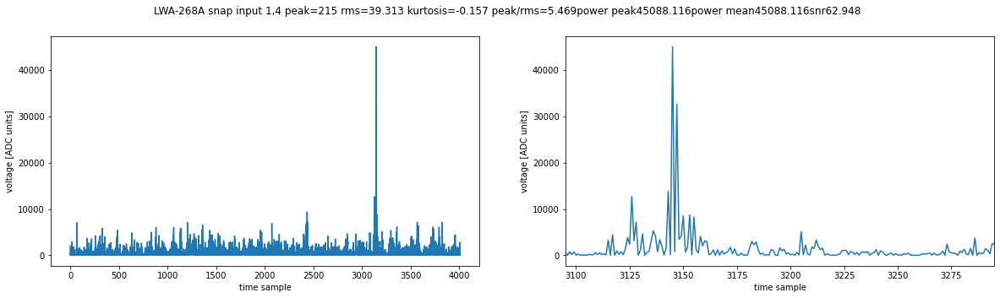

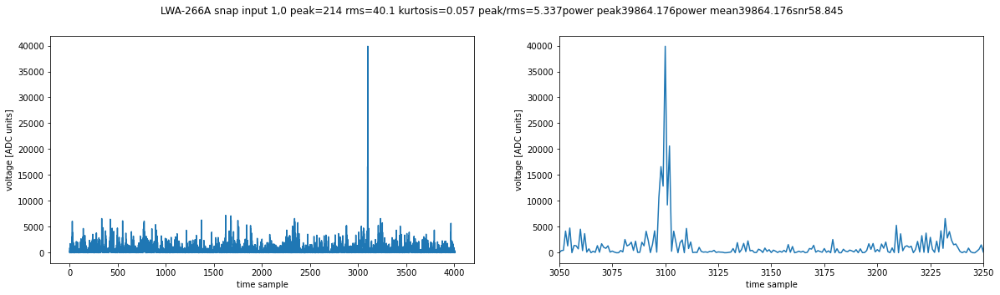

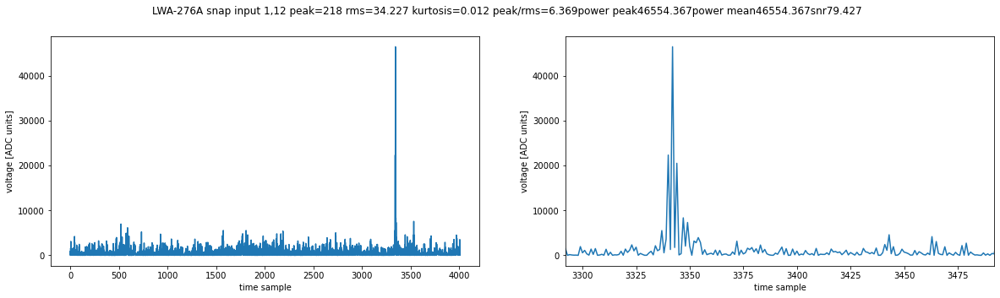

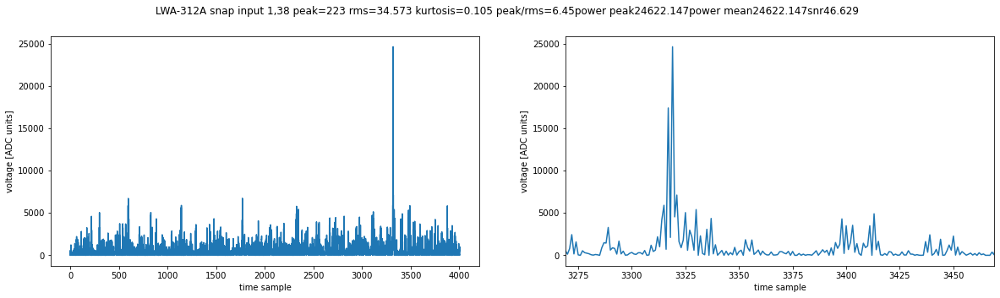

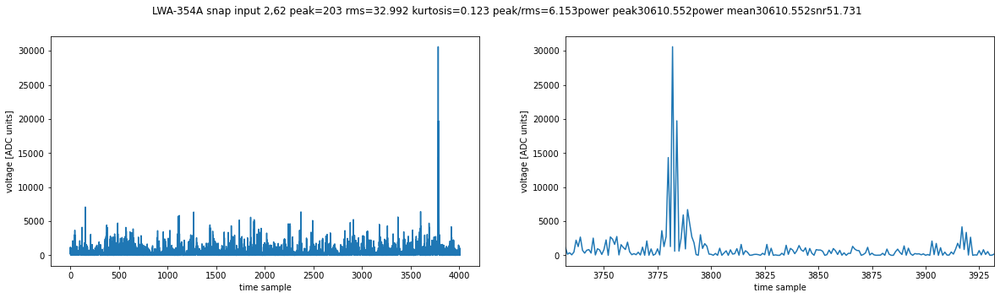

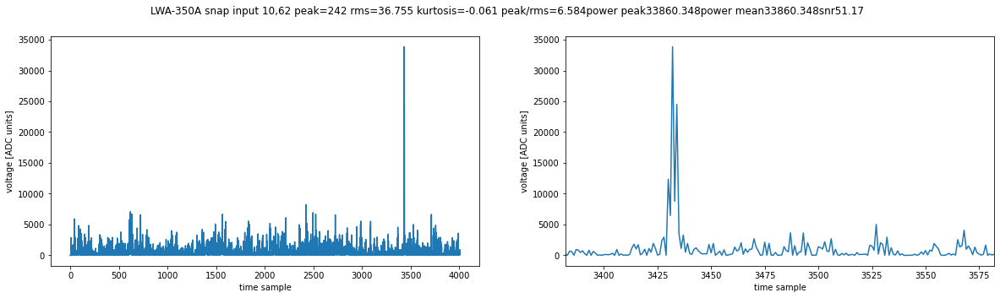

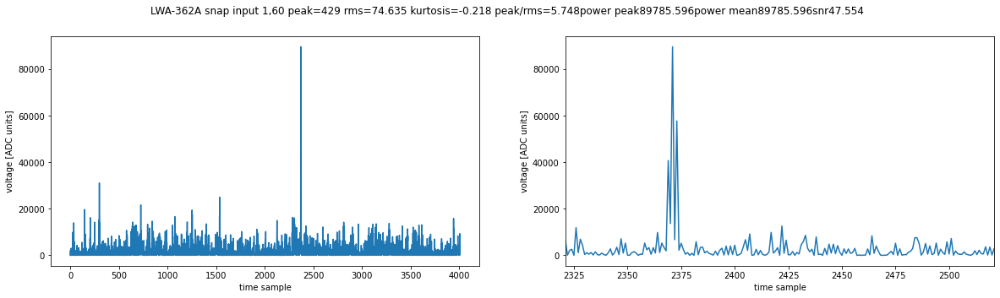

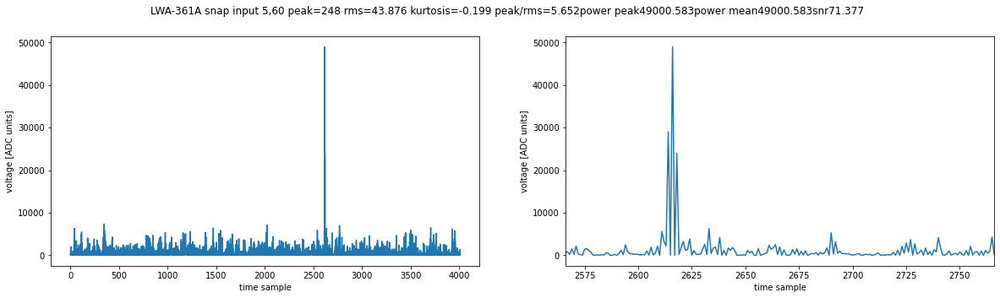

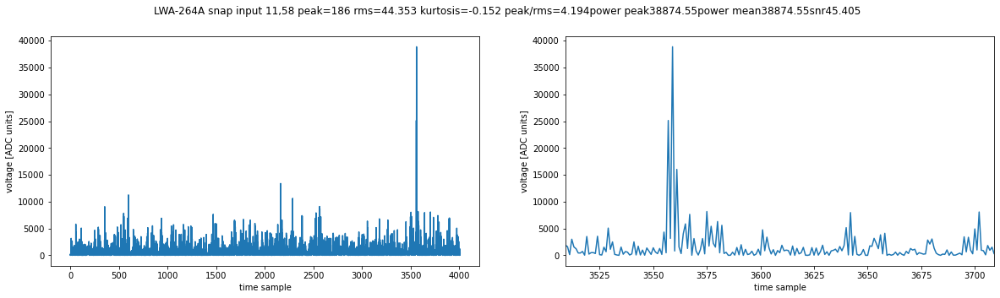

In [52]:
plot_power_timeseries(event_records,['LWA-354A','LWA-264A','LWA-350A','LWA-276A','LWA-312A','LWA-268A','LWA-266A','LWA-361A','LWA-362A'],zoom='peak',Filter1=configuration['filter'],Filter2='None')


overnight1691653137.431842.dat 642986


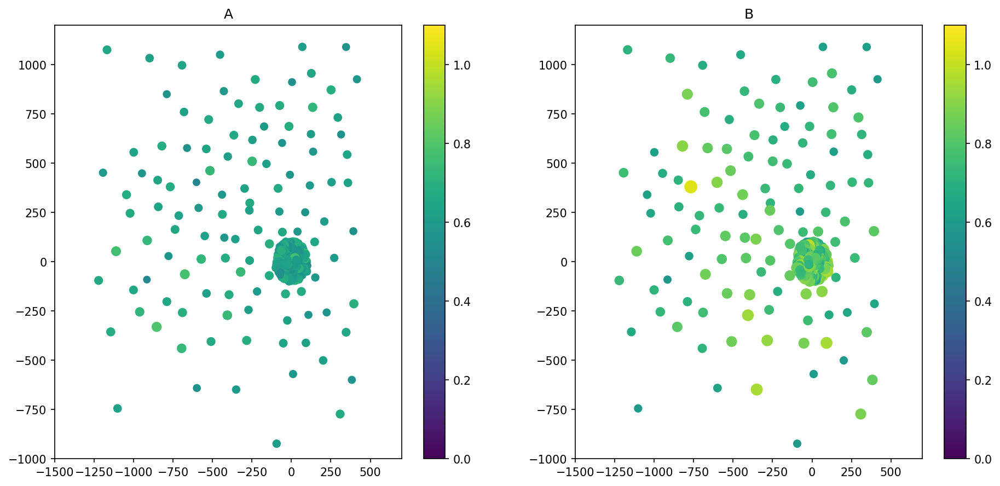

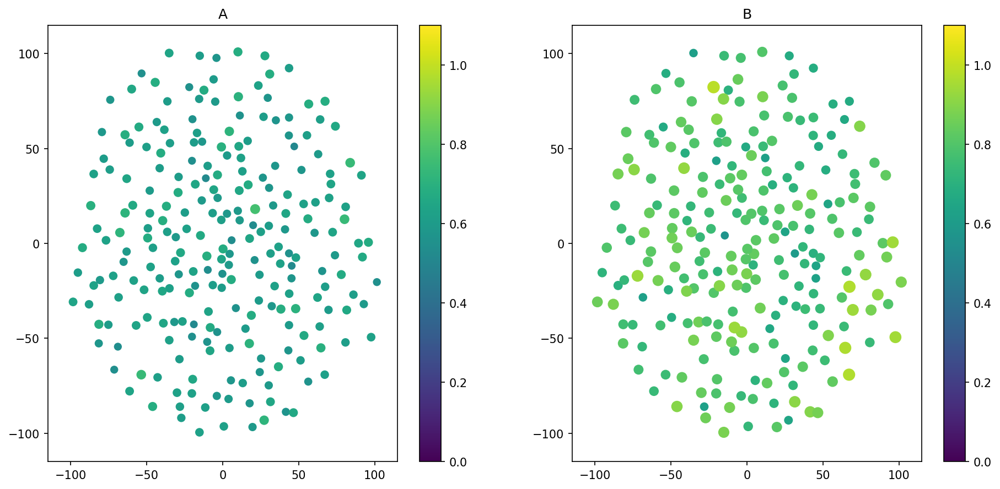

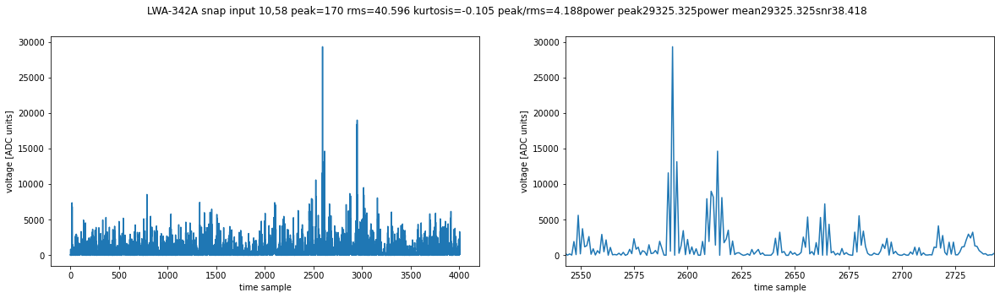

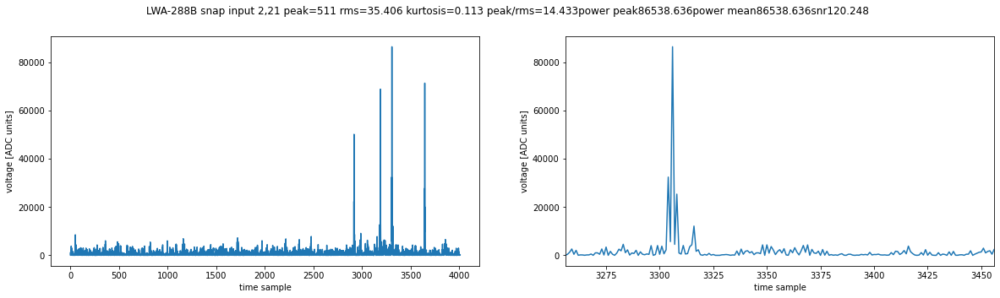

In [53]:
i=5
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

overnight1691652604.4974809.dat 616979


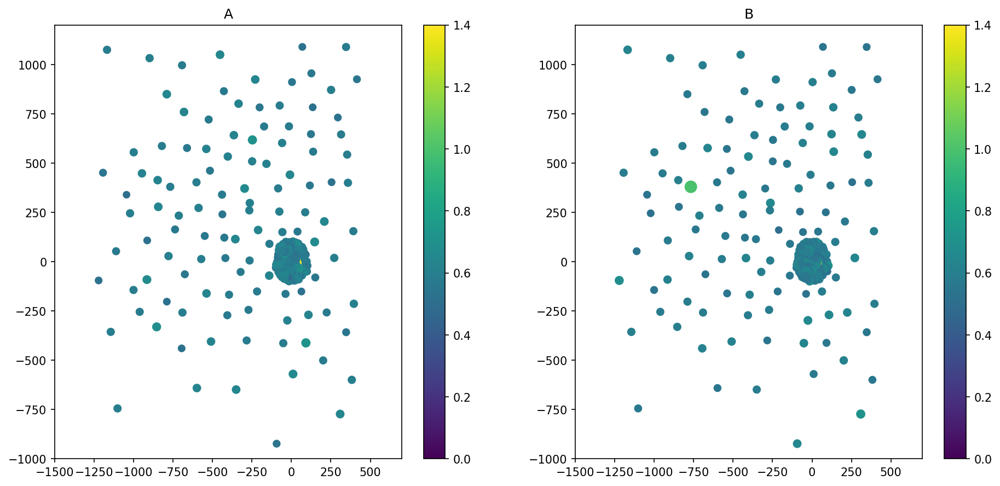

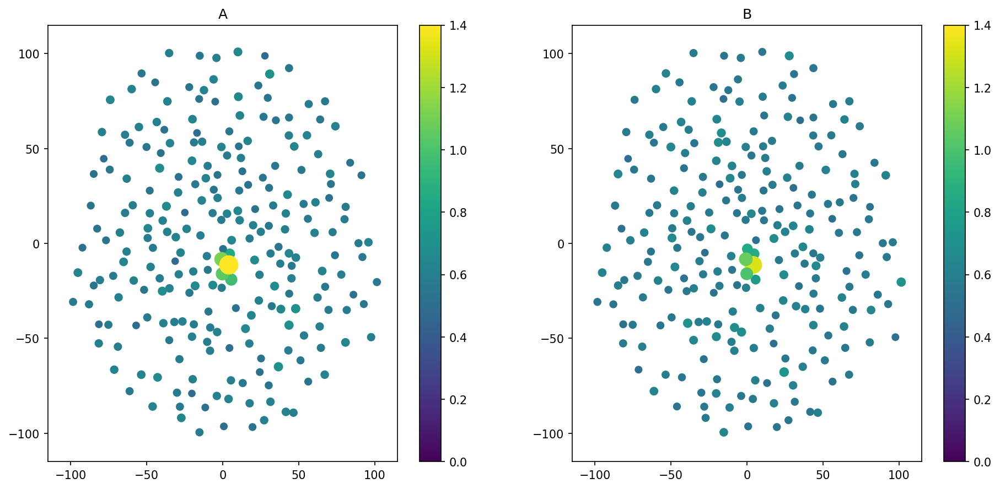

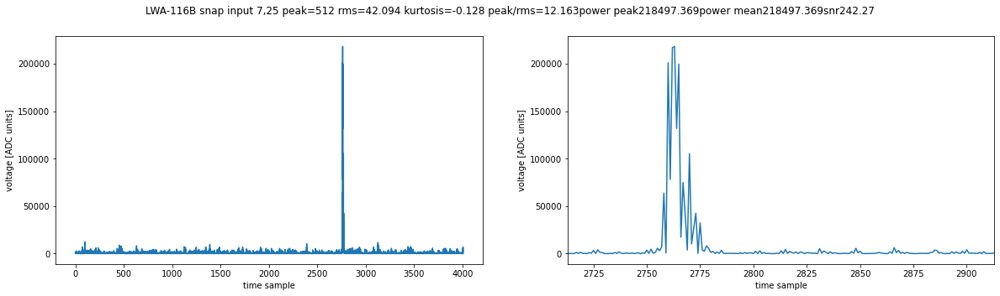

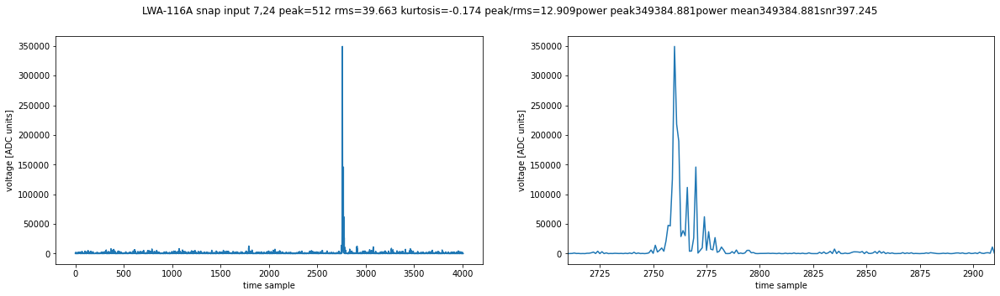

In [54]:
i=6
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.4])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.4])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.4])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.4])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

overnight1691665332.1803102.dat 484416


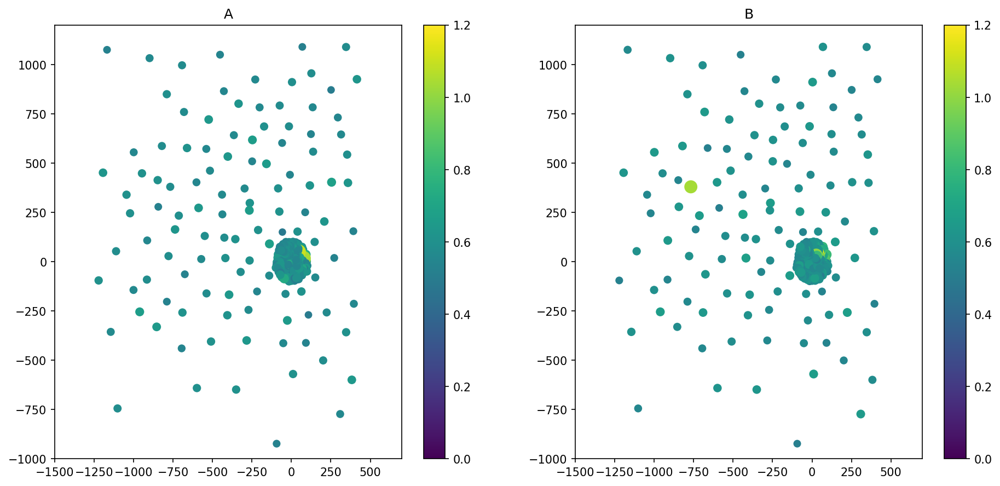

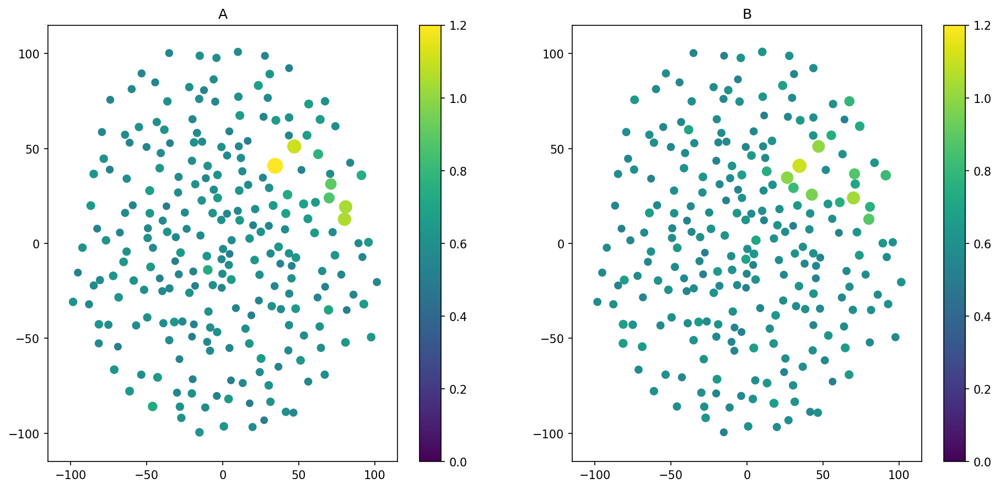

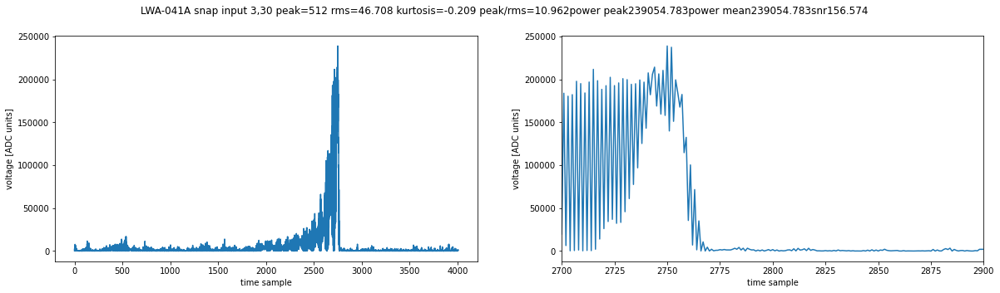

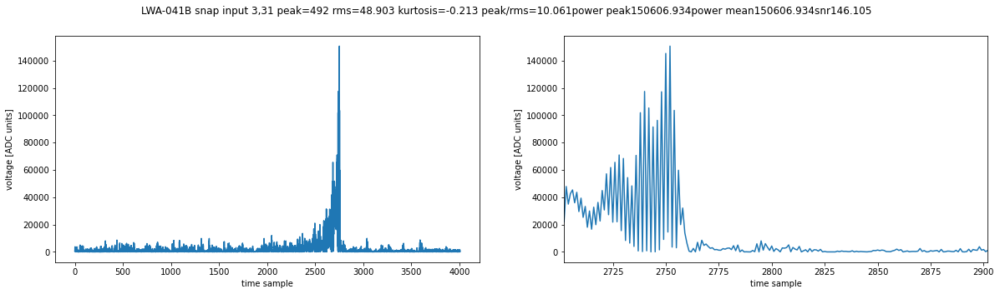

In [55]:
i=7
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.2])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.2])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.2])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.2])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

overnight1691663833.600133.dat 547590


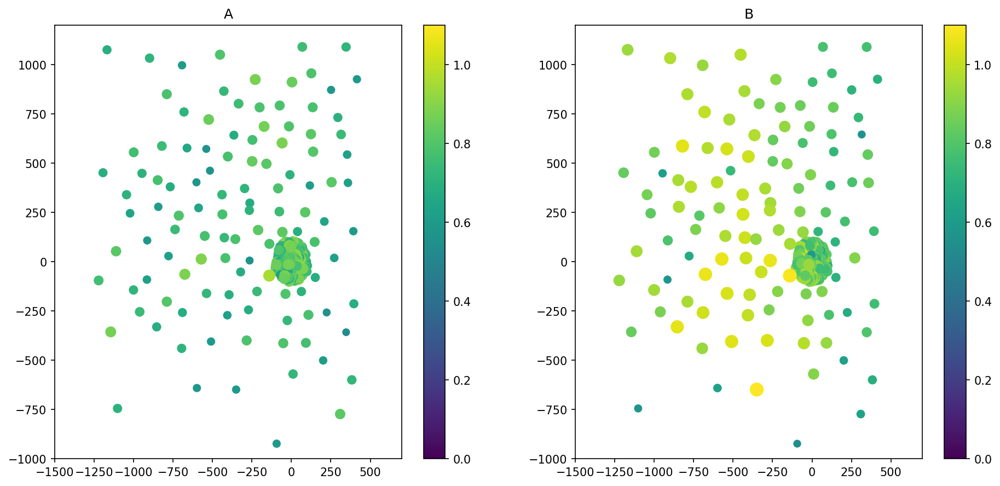

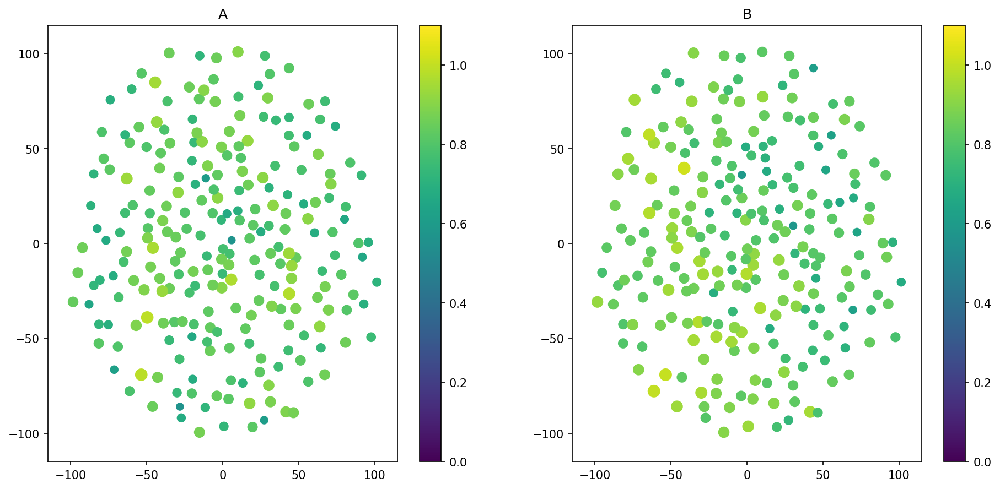

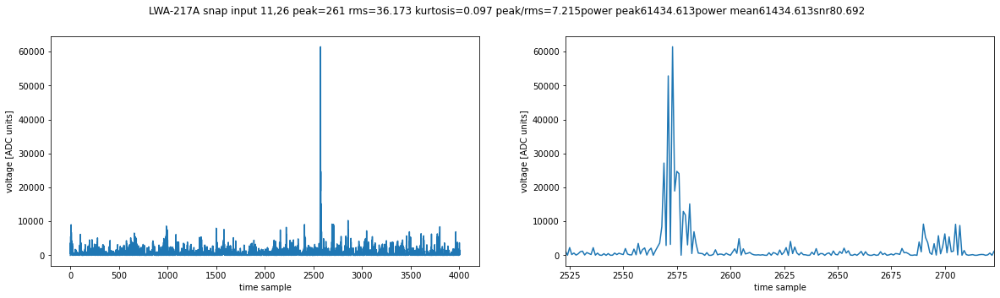

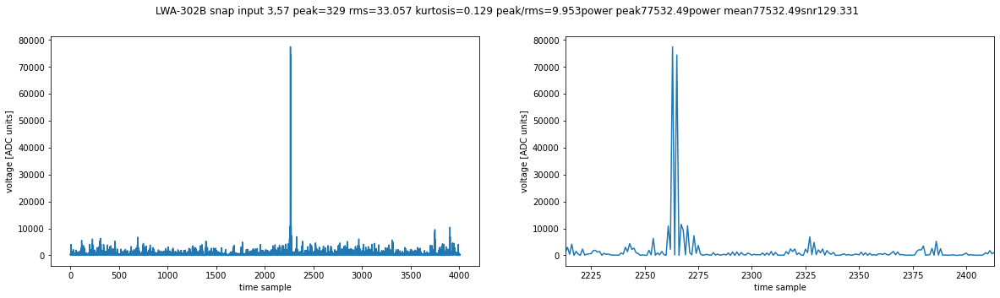

In [56]:
i=8
datafname=interesting[i][0]
datafile=datadir+datafname
index_in_file=interesting[i][1]
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
                                    
plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-1500,700,-1000,1200,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])

plt.figure(figsize=(15,7),dpi=150)
plt.subplot(121)
plt.title('A')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'A',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])
plt.subplot(122)
plt.title('B')
event_scatter_plot(event_summary,'snr',-115,115,-115,115,'B',annotate=False,markerscale=10,scale='log',colorlimits=[0,1.1])
 

a_pol_only=event_summary[event_summary['pol']=='A']
brightestA=a_pol_only['antname'][np.argmax(a_pol_only['snr'])]
b_pol_only=event_summary[event_summary['pol']=='B']
brightestB=b_pol_only['antname'][np.argmax(b_pol_only['snr'])]
print(datafname,index_in_file)
plot_power_timeseries(event_records,[brightestA+'A',brightestB+'B'],zoom='peak',Filter1=configuration['filter'],Filter2='None')
plt.show()

# Which antennas were set as vetos?

In [58]:
for record in event_records:
        record['antname']=lookup_antname_in_dictionary(namedict,record['board_id'],packet_ant_id_2_snap_input(record['antenna_id']))

In [59]:

event_records[0].keys()

dict_keys(['timestamp', 'board_id', 'this_board_triggered', 'coincidence_threshold', 'veto_threshold', 'trigger_power_threshold', 'veto_power_threshold', 'coincidence_window', 'veto_coincidence_window', 'antenna_id', 'trigger_role', 'veto_role', 'data', 'antname'])

In [62]:
used=[]
for r in event_records:
    if r['veto_role']:
        print(r['antname'])
        used.append(r['antname'])
        


LWA-316B
LWA-122A
LWA-334B
LWA-328A
LWA-328B
LWA-361A
LWA-275B
LWA-274A
LWA-302B
LWA-286A
LWA-349B
LWA-253A
LWA-329B
LWA-293A
LWA-348B
LWA-331A
LWA-261B
LWA-256A
LWA-297B
LWA-300B
LWA-254A
LWA-264A
LWA-355B
LWA-319B
LWA-264B
LWA-287A
LWA-315A
LWA-287B
LWA-315B
LWA-299A
LWA-304A
LWA-279A
LWA-364B
LWA-299B
LWA-342B
LWA-348A
LWA-356A
LWA-294A
LWA-356B
LWA-350A
LWA-326B
LWA-350B
LWA-322A
LWA-346A
LWA-322B
LWA-224A
LWA-333B
LWA-359A
LWA-347B
LWA-345A


In [84]:
allant=[r['antname'][:-1] for r in event_records]
x_all=[xdict[name] for name in allant]
y_all=[ydict[name] for name in allant]

In [66]:
usedA=[]
usedB=[]
for n in used:
    if n[-1]=='A':
        usedA.append(n[:-1])
    if n[-1]=='B':
        usedB.append(n[:-1])

In [67]:
intended=['LWA-322','LWA-326','LWA-333','LWA-347',
          'LWA-328','LWA-325','LWA-334','LWA-316',
          'LWA-297','LWA-350','LWA-356','LWA-342',
          'LWA-264','LWA-261','LWA-315','LWA-300',
          'LWA-331','LWA-348','LWA-364',
          'LWA-349','LWA-329','LWA-290','LWA-357',
          'LWA-287','LWA-279','LWA-355',
          'LWA-319','LWA-299','LWA-289',
          'LWA-275','LWA-286','LWA-302','LWA-363']

In [69]:
x_intended=[xdict[name] for name in intended]
y_intended=[ydict[name] for name in intended]
x_usedA=[xdict[name] for name in usedA]
x_usedB=[xdict[name] for name in usedB]
y_usedA=[ydict[name] for name in usedA]
y_usedB=[ydict[name] for name in usedB]

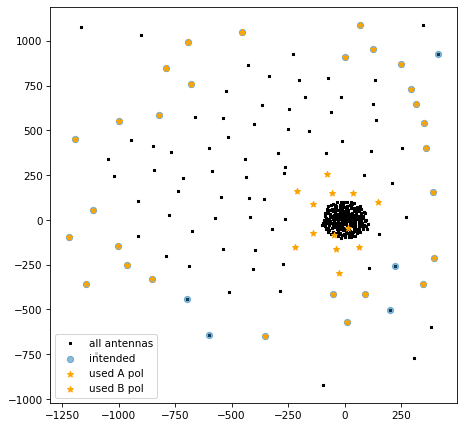

In [95]:
plt.figure(figsize=(7,7),dpi=75)

plt.scatter(x_all,y_all,marker=',',color='k',label='all antennas',s=1)
plt.scatter(x_intended,y_intended,alpha=0.5,label='intended')
plt.scatter(x_usedA,y_usedA,marker='*',label='used A pol',color='orange')
plt.scatter(x_usedB,y_usedB,marker='*',label='used B pol',color='orange')
plt.legend()

LWA-030B


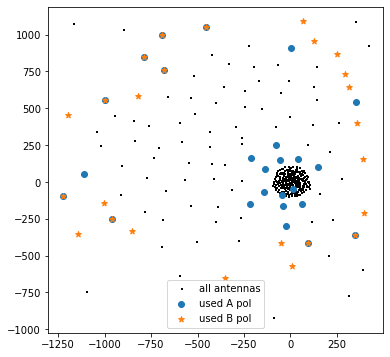

In [96]:
plt.figure(figsize=(6,6))
plt.scatter(x_all,y_all,marker=',',color='k',label='all antennas',s=1)
plt.scatter(x_usedA,y_usedA,marker='o',label='used A pol')
plt.scatter(x_usedB,y_usedB,marker='*',label='used B pol')
plt.legend()